# Visión por Computador - Práctica 1 - Filtrado de Imágenes

#### 12 puntos   |   Fecha de entrega: 03 de Noviembre, 23:59   |   Forma de entrega: a través de la tarea creada en https://pradogrado2425.ugr.es/

### Estudiante: <mark>Mohammed Lahssaini Nouijah</mark>



---

## Normas de entrega

1. Para este trabajo, al igual que para los demás, se debe presentar código, resultados, discusión de los mismos, y presentación y análisis del trabajo realizado, todo integrado en el propio Google Colab Notebook (es decir, no se entrega ninguna memoria separada en `.pdf` ni ningún código `.py`). Se recuerda que código y resultados sin informe explicativo no puntúa.

2. En relación con el punto anterior, solo se acepta la entrega de ficheros `.ipynb` (no resulta válido entregar un fichero `.py`).

3. El diseño de celdas del documento debe ser respetado.

4. Solo se entregará el fichero `.ipynb` (incorporando código, resultados, y explicación del trabajo realizado y los resultados obtenidos) y no se enviarán las imágenes empleadas.

5. El path para la lectura de imágenes, o cualquier otro fichero de entrada, debe ser siempre “/content/drive/My Drive/images/nombre_fichero”

6. El código deberá  presentarse adecudamente comentado y con los resultados obtenidos en cada apartado, junto con la presentación del trabajo realizado y la discusión y análisis de los resultados obtenidos. Es importante reiterar que la entrega de código sin informe explicativo o valoraciones no puntúa. Por otro lado, el código debe ir comentado en comentarios en celdas de código, mientras que el análisis y discusión, tanto del trabajo realizado como de los resultados obtenidos, debe ir en celdas de texto.

Este trabajo de implementación tiene como objetivo principal **familiarizarse con la implementación y uso de filtros de convolución, así como del cálculo de las derivadas de una imagen y sus posibles aplicaciones**.








---



## Funciones de apoyo y conexión con Google Drive

In [1]:
# We start by getting access to the drive
from google.colab import drive
drive.mount('/content/drive', force_remount=True)

Mounted at /content/drive


In [2]:
# We import the modules to use
import os,sys
import cv2, numpy as np, math
from matplotlib import pyplot as plt
# change directory
%cd '/content/drive/My Drive'
#  the current directory
%pwd

# This allows to display images  and to save  them in cells
%matplotlib inline
# this definition allows to read files in a specific path
get_image = lambda route: os.path.join('/content/drive/My Drive/images', route)

/content/drive/My Drive


Las funciones que se incluyen a continuación, se proporcionan como ayuda/apoyo para el estudiante. **En caso de que el alumnado prefiera utilizar otras funciones para lectura, normalización y visualización de imágenes, tiene total libertad para hacerlo, pero sí debe justificar y explicar razonadamente el motivo de dicho cambio y describir las modificaciones realizadas.**

Recuérdese que todas las imágenes a emplear durante las prácticas de todo el curso se pueden encontrar en el enlace de Google Drive indicado en PRADO: https://pradogrado2425.ugr.es/mod/url/view.php?id=91457 En concreto, https://drive.google.com/drive/folders/1UtvY8q6w1Cz9a9T9zxIqSweoRLgNwoW-

In [3]:
'''
This function receives a string with the filename of the image to read,
and a flag indicating if we want to read it in color/RGB (flagColor=1) or gray level (flagColor=0)

Example of use:
im1=readIm(get_image('apple.jpg'),0)

'''
def readIm(filename, flagColor=1):
  # cv2 reads BGR format
  im=cv2.imread(filename)
  # change to  RGB and return the image
  if(flagColor):
    return cv2.cvtColor(im, cv2.COLOR_BGR2RGB)
  # change from BGR to grayscale instead if flag is 0
  return cv2.cvtColor(im, cv2.COLOR_BGR2GRAY)

In [4]:
'''
This function receives an array of arbitrary real numbers (that could include even negative values),
and returns an 'image' in the range [0,1].
flag_GLOBAL allows the user to normalize the whole image (including all channels) or to normalize
each channel/band independently.
'''
def rangeDisplay01(im, flag_GLOBAL= True):
  im = im.astype(float)
  if flag_GLOBAL:
    im = (im - im.min())/(im.max() - im.min())
  else:
    # bands normalization
    for band in range(im.shape[2]):
      im[:, :, band] = (im[:, :, band] - im[:, :, band].min())/(im[:, :, band].max() - im[:, :, band].min())
      # Note: remember that, for plt.imshow with RGB data, the valid range is [0..1] for floats and [0..255] for integers.
  return im

In [5]:
'''
This function displays a single image, including a title, using a magnification factor.

Example of use:
im1=readIm(get_image('apple.jpg'),0)
displayIm(im1,'Manzana',0.5)

'''
def displayIm(im, title='Result',factor= 2):
  # First normalize range
  max=np.max(im)
  min=np.min(im)
  if min<0 or max>255:
    im=rangeDisplay01(im,flag_GLOBAL=True)
  if len(im.shape) == 3:
    # im es tribanda
    plt.imshow(im, cmap='jet')
  else:
    # im es monobanda
    plt.imshow(im, cmap='gray')
  figure_size = plt.gcf().get_size_inches()
  plt.gcf().set_size_inches(factor * figure_size)
  plt.title(title)
  plt.xticks([]), plt.yticks([]) # eliminamos numeración
  plt.show()

In [6]:
'''
This function displays multiple images (including a title and using a magnification factor)
of equal size. The input to the function is a list of images.

Example of use:
im1=readIm(get_image('apple.jpg'),1)
images = [im1,im1,im1]

displayMI_ES(images, title='Manzanas',factor=1)

IMPORTANT NOTE: it is important to notice that this function stacks all images
and later call displayIm(). This implies that the normalization (rangeDisplay01()) is done
at the very end of the process. As a consequence, if the stacked images have different
range values they can be displayed in a "weird" way (with black regions (pixel value = 0)
looking grey). In case the visualization seems to be a problem, a possible solution
would be to create vim using vim.append(rangeDisplay01(...)). In this way, all images
would be on the same range of values (negative values around 0 (black),
0 values around 0.5 (grey), and positive values closer to 1 (white))

'''
def displayMI_ES(vim, title='Result',factor=2):
  # We set the maximun number of images to concatenate by columns
  maxcolumns=3
  # number of images to display
  numberim=len(vim)
  # The simplest case, one row: the maximum number of columns is larger than the images to stack
  # This is, by default, we put together the images column-wise
  if len(vim) < maxcolumns:
    out=vim[0]
    for item in range(1,len(vim)):
      #displayIm(out,str(item),1)
      out=np.hstack((out,vim[item]))

  # Else, if maxcolumns is smaller or equal than the number of images to stack
  else:
    # We check if all rows and columns are going to be 'busy', or if otherwise we need an extra-row
    if np.mod(len(vim),maxcolumns)== 0:
      maxrows=numberim//maxcolumns
    else:
      maxrows=numberim//maxcolumns+1

    # we build up the first block-row
    out=vim[0]
    for item in range(1,maxcolumns):
      out=np.hstack((out,vim[item]))
    # We build up the rest of block-rows
    for block in range(1,maxrows):
      #print(block)
      row=vim[block*maxcolumns]
      for item in range(1,maxcolumns):
        # We still have images to stack
        if block*maxcolumns+item < numberim:
          row=np.hstack((row,vim[block*maxcolumns+item]))
        # We do not have more images, and we have to fill with black
        else:
          row=np.hstack((row,np.zeros(vim[0].shape,dtype=vim[0].dtype)))
          #print(row.dtype)
          # if we don't include ',dtype=vim[0].dtype', np.zeros will include float
          # numbers in the matrix. This will make that the whole matrix will be
          # considered as floats, and values larger than 1 will be clipped to 1,
          # displaying an almost totally white image
      # add the new block-row
      out=np.vstack((out,row))
  return displayIm(out,title,factor)

# **Ejercicio 1: discretización de máscaras y filtrado Gaussiano** (6 puntos)

En este ejercicio aprenderemos a discretizar máscaras de convolución y a aplicarlas sobre imágenes empleando funciones de OpenCV. También buscamos hacerlo de un modo eficiente, y es por ello que, en toda la práctica, se exige el uso de convoluciones 1D (separables).





## A) (1.5 puntos)

En este apartado se deben realizar las siguientes tareas:

1. Calcular las máscaras discretas 1D de la Gaussiana, así como su primera y segunda derivadas (normalizadas), considerando que la entrada a dicha función de creación de máscaras 1D puede ser tanto un posible sigma como un posible tamaño de máscara.
2. Emplear los siguientes valores de sigma ($\{1, 1.5, 2.5, 6\}$) y los siguientes valores de tamaño de máscara ($\{7, 11, 15\}$), y mostrar el perfil (es decir, la silueta de las máscaras como funciones 1D) para verificar que las máscaras creadas son correctas.
3. Describir/explicar/analizar si las formas de dichos kernels tienen sentido y se corresponden con lo que esperaríamos ver.

**Funciones Gaussiana y derivadas:**

**GaussFunc(x, sigma)** calcula el valor de la función Gaussiana en un punto x dado el valor de sigma, que controla el ancho de la campana de Gauss.
**GaussDeriv1Func(x, sigma) y GaussDeriv2Func(x, sigma)** calculan la primera y segunda derivada de la Gaussiana, respectivamente.

**Funciones lambda:**

**gauss_size_from_sigma** convierte el valor de sigma en el tamaño de la máscara. Este tamaño define cuántos elementos tendrá la máscara Gaussiana para un determinado valor de sigma.
**gauss_sigma_from_size** hace lo contrario: dado un tamaño de máscara, calcula el valor de sigma que corresponde a ese tamaño.

**Función gaussianMask1D:**

Esta es la función principal para generar la máscara Gaussiana. Según el valor de sigma y sizeMask (el tamaño de la máscara), crea un array de valores centrados en 0.
Dependiendo del orden especificado (order), genera la máscara utilizando la Gaussiana original o sus derivadas (primera o segunda).

In [7]:
def GaussFunc(x,sigma):
    return (1 / (sigma * np.sqrt(2 * np.pi))) * np.exp(-0.5 * (x / sigma) ** 2)

def GaussDeriv1Func(x, sigma):
    return -(x / (sigma**2)) * GaussFunc(x, sigma)

def GaussDeriv2Func(x, sigma):
    return ((x**2 - sigma**2) / (sigma**4)) * GaussFunc(x, sigma)


gauss_size_from_sigma = lambda sigma: int(np.floor(2 * 3 * sigma + 1) // 2 * 2 + 1)
gauss_sigma_from_size = lambda sizeMask: (sizeMask-1)/6

def gaussianMask1D(sigma=0, sizeMask=0, order=0):
    # Crear un rango de valores centrado en 0
    half_size = sizeMask // 2
    x = np.linspace(-half_size, half_size, sizeMask)

    # Seleccionar la función según el orden
    if order == 0:
        mask = GaussFunc(x, sigma)
    elif order == 1:
        mask = GaussDeriv1Func(x, sigma)
    elif order == 2:
        mask = GaussDeriv2Func(x, sigma)
    else:
        raise ValueError("Order must be 0, 1, or 2")

    return mask

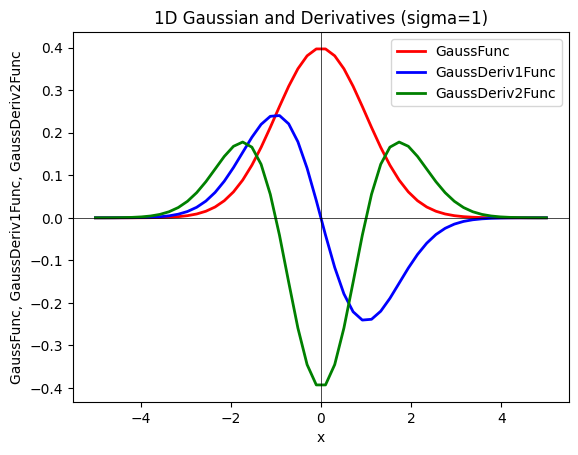

In [8]:
# Con la siguiente figura verificamos que las funciones Gaussianas implementadas son correctas
plt.figure()
xvalues = np.linspace(-5, 5)
yvalues1 = GaussFunc(xvalues,1)
yvalues2 = GaussDeriv1Func(xvalues,1)
yvalues3 = GaussDeriv2Func(xvalues,1)
plt.plot(xvalues, yvalues1, lw=2, color='red',
label='GaussFunc')
plt.plot(xvalues, yvalues2, lw=2, color='blue',
label='GaussDeriv1Func')
plt.plot(xvalues, yvalues3, lw=2, color='green',
label='GaussDeriv2Func')
plt.title('1D Gaussian and Derivatives (sigma=1)')
plt.xlabel('x')
plt.ylabel('GaussFunc, GaussDeriv1Func, GaussDeriv2Func')
plt.axhline(0, lw=0.5, color='black')
plt.axvline(0, lw=0.5, color='black')
plt.legend();

FIJAMOS PRIMERO EL TAMAÑO DE LA MÁSCARA


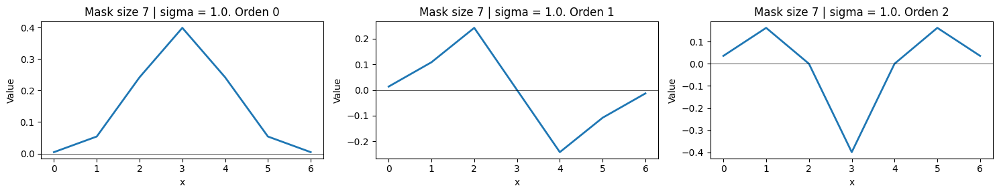

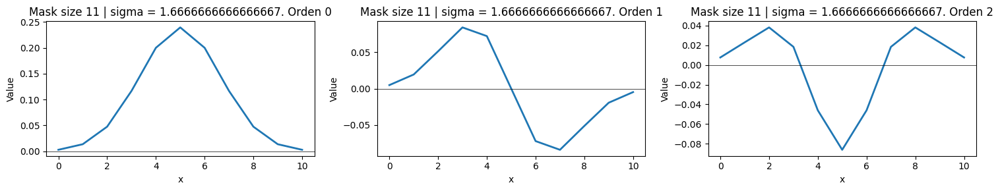

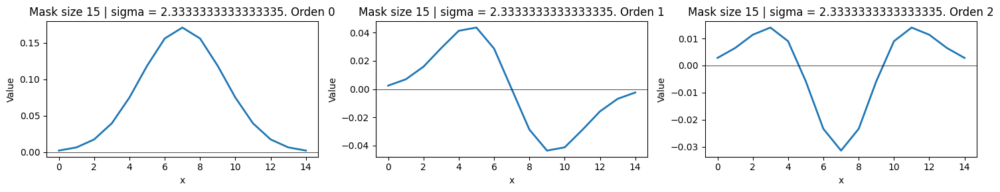

FIJAMOS AHORA EL SIGMA


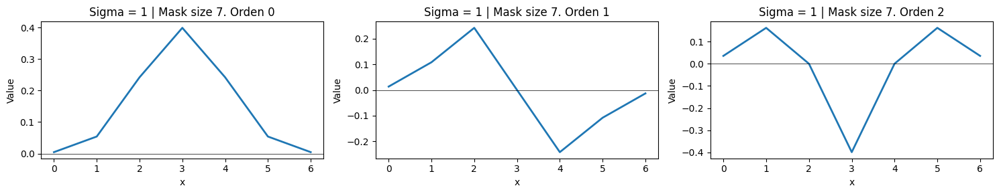

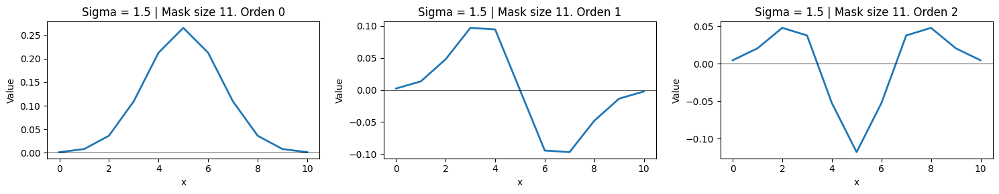

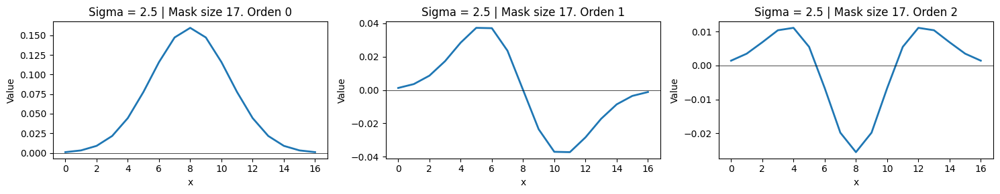

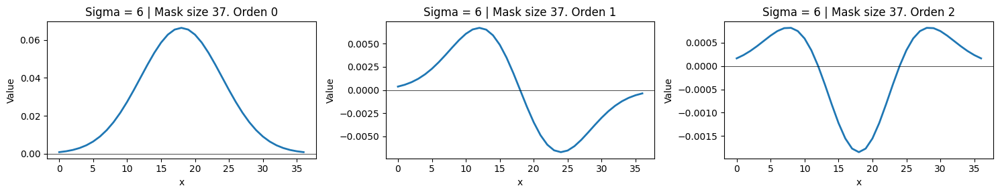

In [9]:
# Valores de sigma y tamaños de máscara
sigma_values = [1, 1.5, 2.5, 6]
size_masks = [7, 11, 15]

plt.rcParams["figure.figsize"] = (15, 3)  # Ajustar tamaño de la figura

print('FIJAMOS PRIMERO EL TAMAÑO DE LA MÁSCARA')
for sizeMask in size_masks:
    plt.figure()
    for i in range(3):  # Para Gaussiana y sus dos derivadas
        plt.subplot(1, 3, i+1)
        sigma = gauss_sigma_from_size(sizeMask)
        mask = gaussianMask1D(sigma=sigma, sizeMask=sizeMask, order=i)
        plt.plot(mask, lw=2)
        plt.title(f'Mask size {sizeMask} | sigma = {sigma}. Orden {i}')
        plt.xlabel('x')
        plt.ylabel('Value')
        plt.axhline(0, lw=0.5, color='black')
    plt.tight_layout()  # Ajuste para evitar solapamiento
    plt.show()

print('FIJAMOS AHORA EL SIGMA')
for sigma in sigma_values:
    plt.figure()
    for i in range(3):  # Para Gaussiana y sus dos derivadas
        plt.subplot(1, 3, i+1)
        sizeMask  = gauss_size_from_sigma(sigma)
        mask = gaussianMask1D(sigma=sigma, sizeMask=sizeMask, order=i)
        plt.plot(mask, lw=2)
        plt.title(f'Sigma = {sigma} | Mask size {sizeMask}. Orden {i}')
        plt.xlabel('x')
        plt.ylabel('Value')
        plt.axhline(0, lw=0.5, color='black')
    plt.tight_layout()  # Ajuste para evitar solapamiento
    plt.show()

**Análisis de los gráficos:**

1. **Máscaras de orden 0 (Gaussiana pura):**
  Estas curvas representan la clásica función Gaussiana, que es simétrica y alcanza su pico en el centro. A medida que aumenta el tamaño de la máscara o sigma, la curva se suaviza, abarcando una mayor área y reduciendo las variaciones locales.
2. **Máscaras de orden 1 (Primera derivada de Gaussiana):**
  Estas curvas muestran una forma de campana invertida, ideal para detectar bordes. Un mayor tamaño de la máscara o sigma amplía el rango de detección de bordes, permitiendo captar transiciones suaves.
3. **Máscaras de orden 2 (Segunda derivada de Gaussiana):**
  Estas curvas tienen una forma de doble campana y son útiles para detectar cambios más sutiles o puntos de inflexión en la imagen, como esquinas o bordes más complejos. Al igual que las anteriores, un mayor sigma amplía el rango de detección.
  
Los resultados obtenidos se ajustan perfectamente a lo esperado según la teoría de la convolución Gaussiana. La variación de sigma y el tamaño de la máscara afectan directamente al nivel de suavizado y la capacidad de la máscara para detectar características en la imagen, como bordes o transiciones.



## B) (1.5 puntos)

En este apartado se debe leer una imagen en escala de grises (`'zebra.jpg'`) y esta debe ser filtrada mostrando el resultado de la convolución con una Gaussiana, con la primera derivada de la Gaussiana (tanto en $X$ como en $Y$), y con la segunda derivada de la Gaussiana (tanto en $X$ como en $Y$). Para ello, hay que:
1. emplear los siguientes sigmas ($\{0.75,1,2,4,8, 16\}$),
2. usar la función de OpenCV `sepFilter2D()` con las máscaras calculadas a partir de las funciones desarrolladas en el apartado anterior,
3. mostrar todas las imágenes dentro del mismo canvas, tal y como se muestra más abajo,
4. analizar los resultados obtenidos y discutir si se corresponden con lo se esperaría obtener en base a nuestro conocimiento de la teoría.




La función **my2DConv** permite realizar una convolución de una imagen en 2D utilizando máscaras Gaussianas de diferentes órdenes (0, 1, o 2). El tamaño de la máscara se calcula en base al valor de sigma, el cual determina el grado de suavizado o la intensidad de las derivadas.

In [10]:
def my2DConv(im, sigma, orders):
    # Calcula el tamaño de la máscara gaussiana a partir del valor de sigma
    sizeMask = gauss_size_from_sigma(sigma)

    # Si los órdenes de derivada son [0, 0], se aplica un suavizado gaussiano en ambas direcciones (X e Y)
    if orders == [0, 0]:  # Suavizado Gaussiano
        mask1Dx = gaussianMask1D(sigma=sigma, sizeMask=sizeMask, order=0)  # Suavizado en X
        mask1Dy = gaussianMask1D(sigma=sigma, sizeMask=sizeMask, order=0)  # Suavizado en Y

    # Si los órdenes son [1, 0], se aplica una derivada en la dirección X y un suavizado en Y
    elif orders == [1, 0]:  # Derivada en X
        mask1Dx = gaussianMask1D(sigma=sigma, sizeMask=sizeMask, order=1)  # Derivada en X
        mask1Dy = gaussianMask1D(sigma=sigma, sizeMask=sizeMask, order=0)  # Suavizado en Y

    # Si los órdenes son [0, 1], se aplica una derivada en Y y un suavizado en X
    elif orders == [0, 1]:  # Derivada en Y
        mask1Dx = gaussianMask1D(sigma=sigma, sizeMask=sizeMask, order=0)  # Suavizado en X
        mask1Dy = gaussianMask1D(sigma=sigma, sizeMask=sizeMask, order=1)  # Derivada en Y

    # Si los órdenes son [2, 0], se aplica una segunda derivada en X y un suavizado en Y
    elif orders == [2, 0]:  # Segunda derivada en X
        mask1Dx = gaussianMask1D(sigma=sigma, sizeMask=sizeMask, order=2)  # Segunda derivada en X
        mask1Dy = gaussianMask1D(sigma=sigma, sizeMask=sizeMask, order=0)  # Suavizado en Y

    # Si los órdenes son [0, 2], se aplica un suavizado en X y una segunda derivada en Y
    elif orders == [0, 2]:  # Segunda derivada en Y
        mask1Dx = gaussianMask1D(sigma=sigma, sizeMask=sizeMask, order=0)  # Suavizado en X
        mask1Dy = gaussianMask1D(sigma=sigma, sizeMask=sizeMask, order=2)  # Segunda derivada en Y

    # Si el orden no es válido, se lanza un error
    else:
        raise ValueError("Invalid derivative order. Must be [0, 0], [1, 0], [0, 1], [2, 0], or [0, 2].")

    # Se aplica la convolución separable en 2D utilizando las máscaras generadas para las direcciones X e Y
    return cv2.sepFilter2D(im, cv2.CV_64F, mask1Dx, mask1Dy)


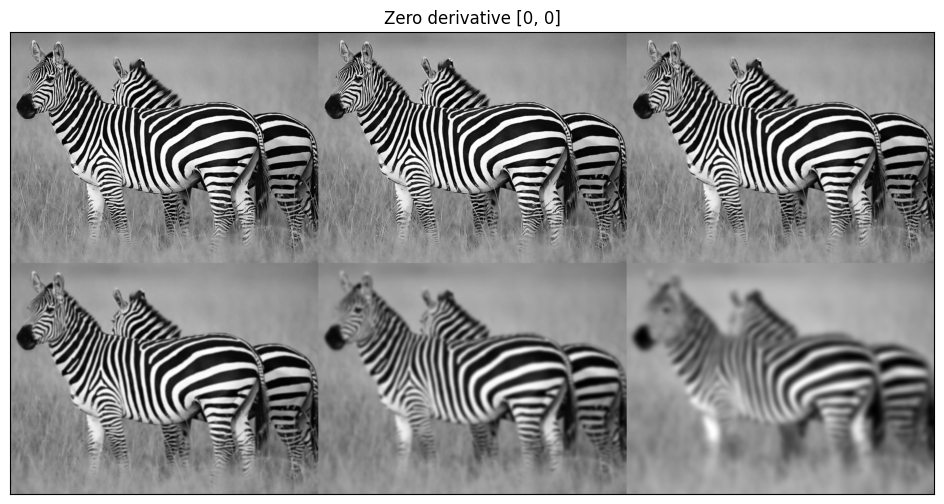

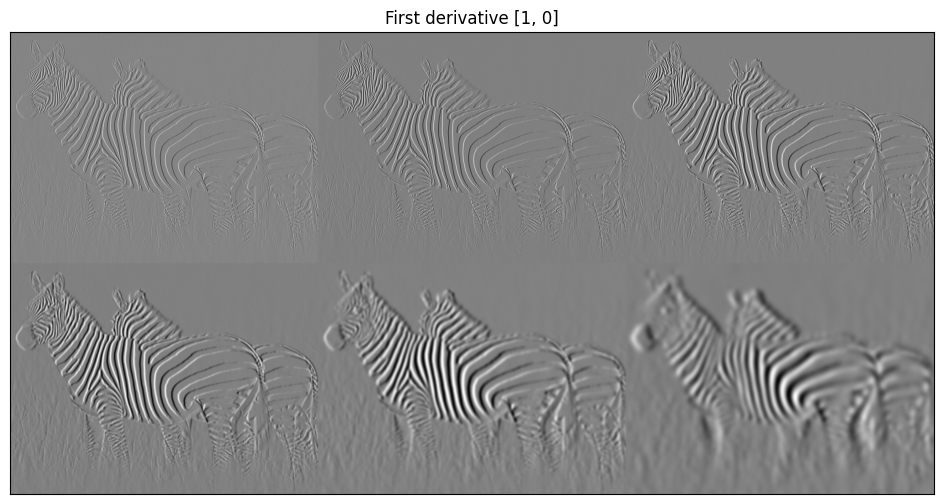

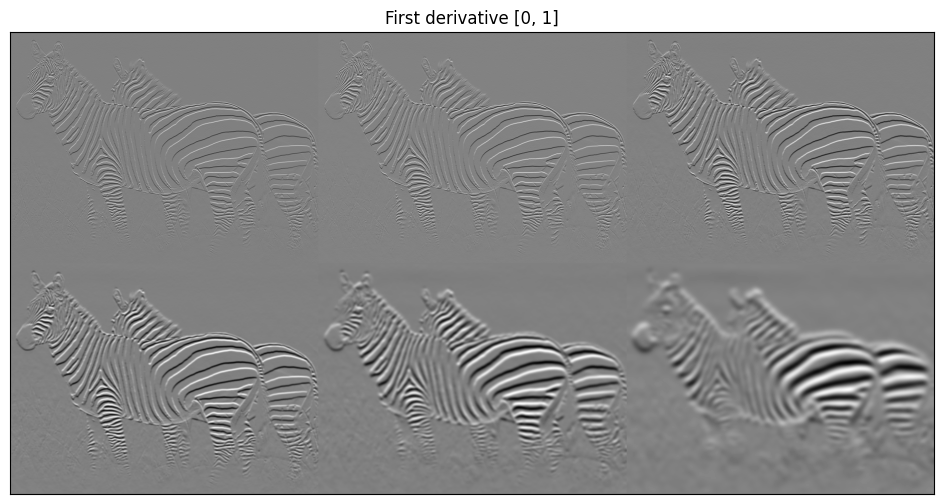

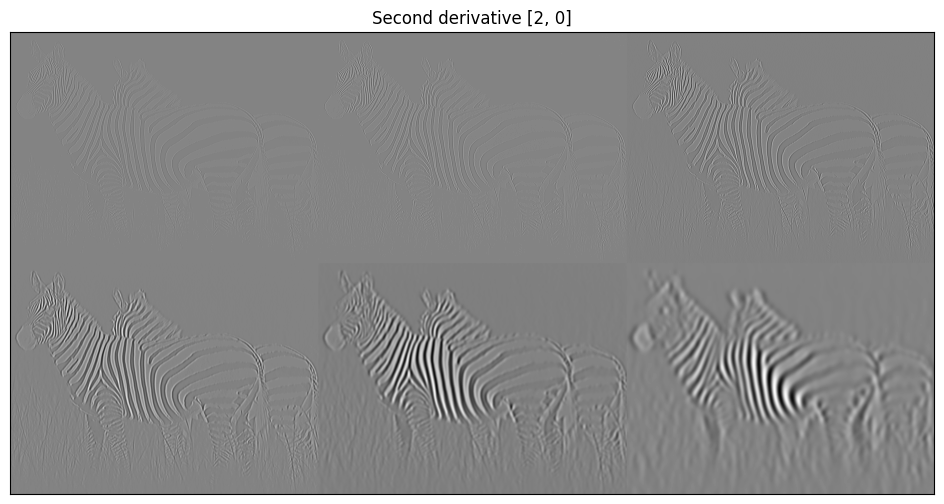

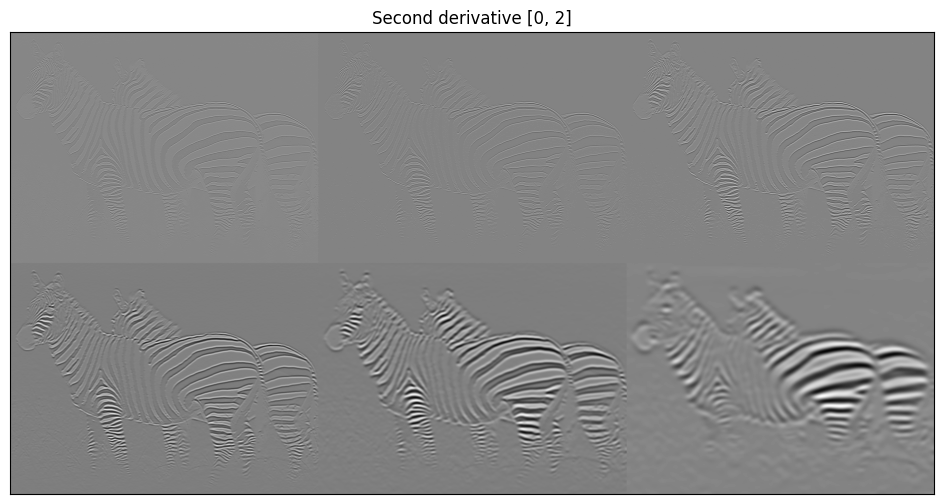

In [11]:
sigmas = [0.75, 1, 2, 4, 8, 16]
im = cv2.imread(get_image('zebra.jpg'), 0)

# Lista de combinaciones de derivadas y sus títulos
combinations = [
    ([0, 0], 'Zero derivative [0, 0]'),       # Suavizado Gaussiano en ambos ejes
    ([1, 0], 'First derivative [1, 0]'),      # Primera derivada en X, suavizado en Y
    ([0, 1], 'First derivative [0, 1]'),      # Primera derivada en Y, suavizado en X
    ([2, 0], 'Second derivative [2, 0]'),     # Segunda derivada en X, suavizado en Y
    ([0, 2], 'Second derivative [0, 2]')      # Segunda derivada en Y, suavizado en X
]

# Iterar sobre cada combinación de derivadas
for orders, title in combinations:
    # Aplicar la convolución con cada sigma en la lista
    vim = [rangeDisplay01(my2DConv(im, sigma, orders), True) for sigma in sigmas]
    # Mostrar la serie de imágenes resultantes
    displayMI_ES(vim, title, 2)


### 1. Imagen suavizada (Zero derivative [0, 0])
- En esta serie de imágenes, el filtro Gaussiano de diferentes sigmas ha sido aplicado a la imagen de la cebra.
- **Sigma pequeño (0.75)**: La imagen se ve muy nítida, ya que el grado de suavizado es bajo. Solo se reduce mínimamente el ruido.
- **Sigma intermedio (1-2)**: A medida que incrementa el valor de sigma, la imagen se suaviza más, lo que reduce los detalles y las texturas finas. Las rayas de la cebra se ven menos definidas.
- **Sigma grande (8-16)**: Con valores altos de sigma, la imagen se suaviza tanto que empieza a perderse la estructura del objeto (las cebras), y solo se observan formas borrosas. El alto suavizado reduce la presencia de bordes y detalles significativos.
- Este comportamiento es típico de los filtros Gaussianos, que eliminan las frecuencias altas de la imagen, manteniendo las estructuras más generales.

---

### 2. Primera derivada (First derivative [0, 1])
- Esta serie muestra el resultado de aplicar la primera derivada Gaussiana en la dirección Y.
- **Sigma pequeño (0.75)**: Las líneas de la cebra están claramente definidas, lo que indica los cambios en las intensidades verticales. En las imágenes derivadas, las transiciones entre blanco y negro de las rayas de la cebra se resaltan.
- **Sigma intermedio (1-2)**: A medida que sigma aumenta, el filtro sigue resaltando los bordes verticales, pero también suaviza las transiciones, lo que hace que las líneas sean más gruesas.
- **Sigma grande (8-16)**: Con valores altos de sigma, las derivadas pierden su nitidez, y los bordes son mucho menos marcados. El filtro resalta solo los cambios de intensidad más grandes, mientras que los detalles más finos se suavizan considerablemente.

---

### 3. Primera derivada (First derivative [1, 0])
- **Descripción**: Esta serie de imágenes muestra la primera derivada en la dirección X, lo que resalta los bordes verticales (cambios de intensidad en la dirección horizontal).
- **Sigma pequeño (0.75)**: Los bordes que delimitan las rayas de la cebra en dirección vertical se ven resaltados con claridad. Este valor de sigma permite capturar los detalles finos, pero puede incluir algo de ruido.
- **Sigma intermedio (1-2)**: A medida que sigma aumenta, las líneas que representan los bordes verticales de las rayas de la cebra se ven más gruesas y suavizadas. Las texturas finas se eliminan, dejando solo las transiciones principales de las rayas.
- **Sigma grande (8-16)**: Con valores altos de sigma, la imagen pierde muchos de los detalles. Solo se mantienen los cambios de intensidad más amplios, mientras que las transiciones de bajo contraste se eliminan, dando una imagen mucho más borrosa y con líneas de bordes difusos.

---

### 4. Segunda derivada (Second derivative [2, 0])
- **Descripción**: Esta serie representa la segunda derivada en la dirección X, lo cual resalta las variaciones de segundo orden en esa dirección. Este operador detecta cambios en la dirección de los bordes verticales.
- **Sigma pequeño (0.75)**: La imagen resultante muestra detalles finos de los bordes verticales, y se destacan los cambios abruptos en la dirección horizontal. Las transiciones de las rayas son visibles, especialmente en las áreas de alta frecuencia.
- **Sigma intermedio (1-2)**: A medida que el sigma aumenta, los bordes más finos y detalles de alta frecuencia comienzan a perderse, y el operador de segunda derivada se concentra en los cambios más amplios y definidos en la dirección horizontal.
- **Sigma grande (8-16)**: Con sigma elevado, la mayoría de los detalles desaparecen y quedan resaltadas solo las transiciones de bordes más grandes en la dirección X. La estructura de la cebra se pierde aún más, y solo se mantienen las transiciones de intensidad de mayor escala.

---

### 5. Segunda derivada (Second derivative [0, 2])
- **Descripción**: En este caso, se aplica la segunda derivada en la dirección Y, resaltando los cambios de segundo orden en la dirección vertical.
- **Sigma pequeño (0.75)**: Los cambios de intensidad a lo largo de las rayas de la cebra en la dirección vertical se ven resaltados. La imagen muestra detalles de alto contraste, especialmente en las zonas donde hay transiciones abruptas.
- **Sigma intermedio (1-2)**: Con un sigma mayor, los detalles de las transiciones en la dirección vertical se suavizan, y el operador responde solo a cambios de intensidad más amplios.
- **Sigma grande (8-16)**: A medida que el valor de sigma incrementa, los detalles finos se pierden completamente, y solo los cambios de intensidad más grandes en la dirección vertical son visibles. La imagen pierde casi toda la información detallada de las rayas de la cebra, dejando únicamente áreas de cambio de intensidad de bajo detalle.

---

### Análisis General
- **Efecto del Sigma en Derivadas**: A lo largo de todos los casos, observamos que un sigma bajo permite capturar más detalles y transiciones finas en las derivadas, mientras que un sigma alto elimina los detalles y deja solo las transiciones de baja frecuencia.
- **Interpretación Visual**: Los operadores de primera derivada resaltan las transiciones en una dirección específica (X o Y), mientras que los operadores de segunda derivada capturan cambios en la curvatura o transición de los bordes en la dirección especificada.
- **Conclusión**: Estos resultados ilustran cómo el valor de sigma controla el nivel de detalle que se preserva o elimina en las imágenes derivadas. Un sigma alto es útil para ver transiciones generales, mientras que un sigma bajo captura detalles finos, especialmente útil en aplicaciones de detección de bordes.


**Justificación y análisis:**

- El comportamiento esperado en una convolución Gaussiana es que, a medida que aumenta sigma, se incrementa el nivel de suavizado. Esto se puede observar en las imágenes con derivada cero, donde los detalles van desapareciendo conforme aumenta sigma.
- Las imágenes con derivadas muestran cómo los filtros Gaussianos pueden resaltar los cambios de intensidad en diferentes direcciones. Para derivadas de primer orden, los bordes se resaltan, pero también se suavizan más con valores altos de sigma.

## C) (1 punto)

En este apartado hay que emplear la función de OpenCV `sepFilter2D()` con $\sigma=2.0$ para calcular y mostrar el gradiente (4 imágenes: derivada en $X$, derivada en $Y$, magnitud y orientación) y la Laplaciana de la Gaussiana. Se debe explicar el trabajo realizado, incluyendo las expresiones matemáticas subyacentes y el análisis, al igual que en todos los ejercicios, relativo a si los resultados obtenidos se corresponden con lo esperado.

**Cálculo del gradiente en X y Y (gradientIM):**
Esta función utiliza la convolución para calcular el gradiente de una imagen en las direcciones X y Y. Los gradientes se obtienen aplicando la función my2DConv con órdenes de derivada diferentes: [1, 0] para la dirección X y [0, 1] para la dirección Y, dx representa el gradiente en la dirección horizontal (X), y dy el gradiente en la dirección vertical (Y).

*Nota:* Los gradientes indican cómo cambia la intensidad de los píxeles en cada dirección, proporcionando información sobre los bordes y cambios de intensidad en la imagen.

**Cálculo de la Laplaciana de la Gaussiana (laplacianG):**
Esta función calcula la Laplaciana de la imagen, que es la suma de las segundas derivadas en las direcciones X e Y. Para obtenerla, se utilizan derivadas de segundo orden en cada dirección: [2, 0] para la dirección X y [0, 2] para la dirección Y.

*Nota:* La Laplaciana se utiliza comúnmente para detectar bordes y puntos de interés en una imagen, ya que captura cambios de intensidad en ambas direcciones.

**Cálculo de la magnitud y orientación del gradiente (gradMagnitudeOrientation):**

A partir de los gradientes en X e Y calculados previamente, se obtiene la magnitud y la orientación del gradiente.
- La magnitud se calcula como la raíz cuadrada de la suma de los cuadrados de los gradientes. Esta magnitud indica la "fuerza" del cambio de intensidad en la imagen.

- La orientación del gradiente se calcula usando la función arctan2:
orientation=arctan2(dy,dx). Esto proporciona el ángulo de los bordes o las direcciones de mayor cambio en la imagen.

*Nota:* Esta información es útil para tareas como la detección de bordes, donde tanto la fuerza como la dirección del borde son importantes.

**Normalización de la imagen para visualización (normalizeImage):**

- Esta función normaliza la imagen para que sus valores estén entre 0 y 255, lo que permite visualizarla correctamente en una escala de grises.

- La función cv2.normalize realiza esta operación, y luego la imagen es convertida a tipo uint8 para que pueda ser interpretada por las bibliotecas de visualización de imágenes.


In [12]:
# Función que calcula el gradiente en X y Y
def gradientIM(im, sigma):
    # Derivada en X
    dx = my2DConv(im, sigma, [1, 0])
    # Derivada en Y
    dy = my2DConv(im, sigma, [0, 1])
    return dx, dy

# Función que calcula la Laplaciana de la Gaussiana
def laplacianG(im, sigma):
    # Segunda derivada en X
    d2x = my2DConv(im, sigma, [2, 0])
    # Segunda derivada en Y
    d2y = my2DConv(im, sigma, [0, 2])
    # Laplaciana es la suma de las segundas derivadas
    return d2x + d2y

# Función para calcular la magnitud y orientación del gradiente
def gradMagnitudeOrientation(dx, dy):
    # Magnitud del gradiente
    magnitude = np.sqrt(dx**2 + dy**2)
    # Orientación del gradiente
    orientation = np.arctan2(dy, dx)
    return magnitude, orientation

# Función para normalizar la imagen antes de mostrarla
def normalizeImage(im):
    im_normalized = cv2.normalize(im, None, alpha=0, beta=255, norm_type=cv2.NORM_MINMAX)
    return im_normalized.astype(np.uint8)


In [13]:
# Función para visualizar los resultados para este apartado
def displayResults(dx, dy, magnitude, orientation, laplacian):
    plt.figure(figsize=(12, 8))

    # Derivada en X
    plt.subplot(2, 3, 1)
    plt.imshow(normalizeImage(dx), cmap='gray')
    plt.title('Gradient in X')
    plt.axis('off')

    # Derivada en Y
    plt.subplot(2, 3, 2)
    plt.imshow(normalizeImage(dy), cmap='gray')
    plt.title('Gradient in Y')
    plt.axis('off')

    # Magnitud del gradiente
    plt.subplot(2, 3, 3)
    plt.imshow(normalizeImage(magnitude), cmap='gray')
    plt.title('Gradient Magnitude')
    plt.axis('off')

    # Orientación del gradiente
    plt.subplot(2, 3, 4)
    plt.imshow(orientation, cmap='gray')
    plt.title('Gradient Orientation')
    plt.axis('off')

    # Laplaciana de la Gaussiana
    plt.subplot(2, 3, 5)
    plt.imshow(normalizeImage(laplacian), cmap='gray')
    plt.title('Laplacian of Gaussian (LoG)')
    plt.axis('off')

    plt.tight_layout()
    plt.show()


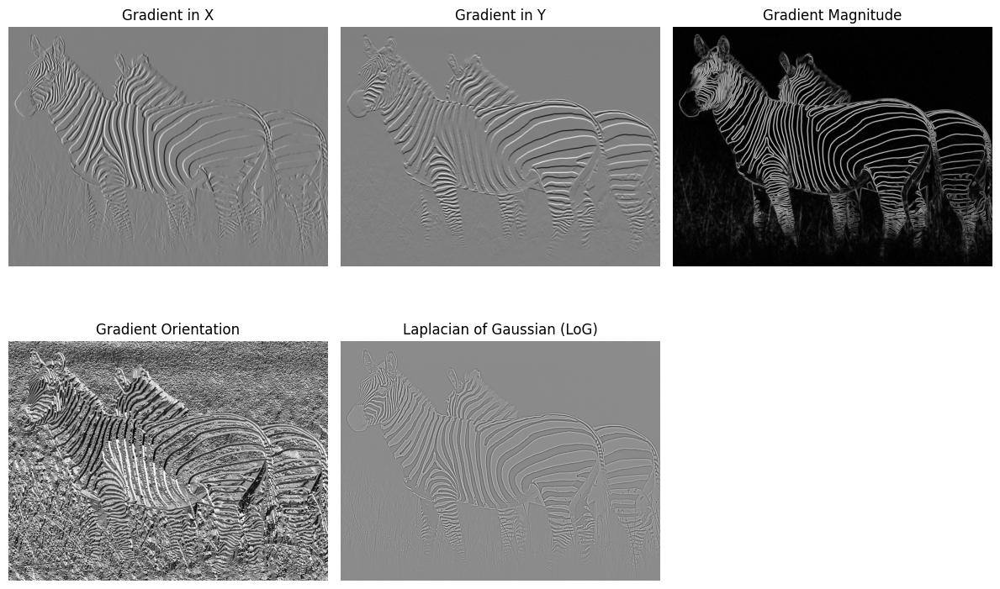

In [14]:
# Cargar la imagen en escala de grises
im = cv2.imread(get_image('zebra.jpg'), 0)

# Definir el valor de sigma
sigma = 2.0

# Calcular las derivadas en X e Y
dx, dy = gradientIM(im, sigma)

# Calcular la magnitud y orientación del gradiente
magnitude, orientation = gradMagnitudeOrientation(dx, dy)

# Calcular la Laplaciana de la Gaussiana
laplacian = laplacianG(im, sigma)

# Mostrar los resultados
displayResults(dx, dy, magnitude, orientation, laplacian)


1. **Gradient in X (Gradiente en X)**
  - Descripción: La imagen muestra las variaciones de intensidad en la dirección horizontal (eje X). El gradiente en X resalta los bordes verticales, lo que es evidente en las rayas de la cebra, que son patrones altamente contrastantes. Las zonas con mayor cambio de color aparecen como líneas claras o sombras oscuras, lo que indica una alta pendiente en esa dirección.
  * Interpretación: La estructura de las rayas verticales es clara. El gradiente en X ayuda a resaltar esos bordes porque representa las diferencias de intensidad entre píxeles adyacentes en la dirección horizontal.
2. **Gradient in Y (Gradiente en Y)**
  * Descripción: La imagen ahora muestra las variaciones de intensidad en la dirección vertical (eje Y). Al igual que el gradiente en X, aquí se resaltan los bordes horizontales en lugar de los verticales. Las rayas horizontales (o diagonales) de la cebra parecen más prominentes en esta representación.
  * Interpretación: Las zonas que tienen cambios significativos en la dirección vertical, como las piernas de las cebras y algunas rayas diagonales, son las más destacadas. Esto es útil para detectar patrones horizontales en la imagen.
3. **Gradient Magnitude (Magnitud del Gradiente)**
  * Descripción: La magnitud del gradiente es una combinación de los gradientes en X y Y y nos dice cuán abrupto es el cambio en cada punto de la imagen, sin importar la dirección. En esta imagen, las rayas de las cebras aparecen con mucha claridad, y las zonas de mayor cambio de intensidad (como los bordes) son más brillantes.
  * Interpretación: La imagen resultante resalta todos los bordes con cambios significativos de intensidad en *cualquier dirección*. La magnitud del gradiente es útil para destacar los contornos, ya que combina información de las dos direcciones (X e Y), siendo de gran utilidad para la detección de bordes.
4. **Gradient Orientation (Orientación del Gradiente)**
  * Descripción: La orientación del gradiente indica la dirección de mayor cambio de intensidad en cada punto. En esta representación, se observa cómo las diferentes partes de la imagen tienen orientaciones distintas, lo que puede ser útil para analizar las estructuras de la imagen, como la orientación de los bordes.
  * Interpretación: La orientación nos dice en qué dirección están alineados los bordes o cambios de intensidad en la imagen. Por ejemplo, las rayas diagonales de las cebras tendrán diferentes orientaciones de gradiente en comparación con las rayas verticales.
5. **Laplacian of Gaussian (LoG, Laplaciana de la Gaussiana)**
  * Descripción: La laplaciana de la gaussiana combina la segunda derivada en ambas direcciones (X e Y) y se usa comúnmente para la detección de bordes. Aquí, la imagen muestra las zonas de cambio de intensidad más prominentes, resaltando los contornos y las zonas con bordes pronunciados.
  * Interpretación: La laplaciana resalta las transiciones más bruscas en la imagen, identificando los bordes con cambios más rápidos de intensidad. Este operador es útil para detectar bordes y esquinas en la imagen.


**Nota(Utilidad):**

Cada una de estas representaciones aporta una visión distinta de las características de la imagen:

- El gradiente en X e Y nos ayuda a entender los cambios en las intensidades en direcciones específicas.
- La magnitud del gradiente nos da una visión general de la "fuerza" o intensidad del cambio en toda la imagen.
- La orientación del gradiente nos informa sobre las direcciones en las que esos cambios ocurren.
- La laplaciana de la gaussiana es útil para la detección de bordes importantes, eliminando variaciones pequeñas de intensidad mediante el suavizado gaussiano.

## D) (1.5 puntos)

Implemente una función para realizar "a mano" la convolución separable (es decir, empleando kernels 1D). Dicha función debe recibir como entrada una imagen (con el _padding_ adecuado, en caso de que lo necesite, ya incorporado) y un kernel 1D, y debe proporcionar como salida la imagen convolucionada con el kernel en ambas direcciones.

Una vez haya implementado la función, realice el suavizado de la imagen `motorcycle.bmp` (usando un _Gaussian kernel size_ de 7, y dejando que sea la propia función de creación del kernel la que determine el $\sigma$ adecuado), y compare el resultado con el de `cv2.GaussianBlur` (en donde se debe optar por la misma estrategia: fijando $ksize=7$ y dejando que sea la propia función de OpenCV la que escoja el sigma). ¿Hay diferencias (sea a nivel de resultado final o de tiempo de ejecución)? En caso afirmativo, ¿a qué se pueden deber?

In [15]:
# Función que realiza una convolución 1D en una imagen a lo largo de una dirección
def convolve1D(image, kernel):
    # Obtenemos las dimensiones de la imagen (alto y ancho)
    h, w = image.shape
    # Obtenemos la longitud del kernel 1D
    k_len = len(kernel)
    # Calculamos el padding (la mitad del tamaño del kernel)
    pad = k_len // 2

    # Inicializamos la imagen de salida con el mismo tamaño que la original, pero con ceros
    output = np.zeros_like(image, dtype=np.float64)

    # Aplicamos padding a la imagen para poder manejar los bordes
    # Se añade padding en ambas direcciones (arriba, abajo) usando ceros
    padded_image = np.pad(image, ((pad, pad),), mode='constant')

    # Convolución 1D a lo largo de las filas (horizontalmente)
    for i in range(h):  # Recorremos cada fila de la imagen
        for j in range(w):  # Recorremos cada columna de la imagen
            # Para cada píxel (i, j), aplicamos la operación de convolución tomando una ventana de la imagen
            # multiplicando los valores por el kernel y sumando los resultados
            output[i, j] = np.sum(padded_image[i, j:j+k_len] * kernel)

    # Devolvemos la imagen convolucionada
    return output

# Función que realiza la convolución 2D usando convoluciones 1D separables
def convolve2D(image, kx, ky):
    # Primer paso: convolución en la dirección horizontal (X) usando el kernel kx
    temp_output = convolve1D(image, kx)

    # Segundo paso: convolución en la dirección vertical (Y) usando el kernel ky
    # Primero transponemos la imagen para tratar las columnas como filas
    # Después transponemos nuevamente para obtener la imagen convolucionada final
    final_output = convolve1D(temp_output.T, ky).T

    # Devolvemos la imagen final tras la convolución 2D
    return final_output


**Etapas del código:**

1. Calcular el kernel gaussiano 1D:
  - Se utiliza la función gaussianMask1D para generar un kernel gaussiano en una dimensión (1D) con el tamaño (ksize = 7).

2. Aplicar convolución manual (separable):

  - Se utiliza la función convolve2D, que realiza la convolución de la imagen utilizando la separación del filtro en las direcciones X (horizontal) y Y (vertical).
  - Se mide el tiempo que toma ejecutar esta operación utilizando time.time() para luego compararlo con el método de OpenCV.
3. Aplicar GaussianBlur de OpenCV:
  - OpenCV realiza la convolución utilizando su función optimizada GaussianBlur, que también acepta un kernel gaussiano con tamaño ksize. Aquí, sigmaX=0 permite que OpenCV calcule el valor de sigma automáticamente.
Se mide el tiempo de ejecución de este método para compararlo con la convolución manual.

4. Mostrar tiempos de ejecución:

  - Los tiempos de ejecución para la convolución manual y la de OpenCV se imprimen para observar la diferencia en la eficiencia entre ambos métodos.

5. Mostrar los resultados visuales:

  - Se muestran las imágenes resultantes de las tres etapas: la imagen original, el resultado de la convolución manual y el resultado de GaussianBlur de OpenCV. Esto permite comparar los resultados visuales de cada técnica.

In [16]:
import time

# Comparar la función con el GaussianBlur de OpenCV
def compare_convolution(image, ksize):
    # Crear el kernel gaussiano con el tamaño adecuado (kernel size = 7)
    sigma = (ksize - 1) / 6.0  # Estimación de sigma para ksize=7
    kernel_1d = gaussianMask1D(sigma=sigma, sizeMask=ksize, order=0)

    # Aplicar convolución separable manual
    start_manual = time.time()
    manual_result = convolve2D(image, kernel_1d, kernel_1d)
    end_manual = time.time()

    # Aplicar GaussianBlur de OpenCV
    start_opencv = time.time()
    opencv_result = cv2.GaussianBlur(image, (ksize, ksize), sigmaX=0)
    end_opencv = time.time()

    # Mostrar tiempos
    print(f"Tiempo de ejecución (manual): {end_manual - start_manual:.6f} segundos")
    print(f"Tiempo de ejecución (OpenCV): {end_opencv - start_opencv:.6f} segundos")

    # Mostrar los resultados
    plt.figure(figsize=(12, 6))

    plt.subplot(1, 3, 1)
    plt.imshow(image, cmap='gray')
    plt.title('Imagen original')

    plt.subplot(1, 3, 2)
    plt.imshow(manual_result, cmap='gray')
    plt.title('Convolución manual (2D separable)')

    plt.subplot(1, 3, 3)
    plt.imshow(opencv_result, cmap='gray')
    plt.title('GaussianBlur (OpenCV)')

    plt.tight_layout()
    plt.show()

    return manual_result, opencv_result

Tiempo de ejecución (manual): 1.799657 segundos
Tiempo de ejecución (OpenCV): 0.001820 segundos


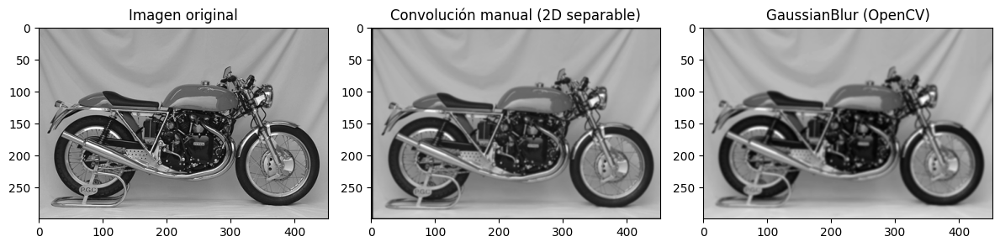

In [17]:
# Cargar la imagen motorcycle.bmp
filename = 'motorcycle.bmp'
image = cv2.imread(get_image(filename), 0)

# Definir el tamaño del kernel
ksize = 7

# Comparar los resultados
manual_result, opencv_result = compare_convolution(image, ksize)

**Análisis de los Resultados**

- Convolución manual (2D separable):
  - La imagen convolucionada usando la función manual muestra un desenfoque suave, aunque ligeramente más nítido en comparación con el resultado de OpenCV. Esto es debido a diferencias sutiles en la implementación del cálculo del sigma en la convolución manual.
- GaussianBlur (OpenCV):

  - El resultado de GaussianBlur muestra un desenfoque más uniforme y parece ligeramente más suave que el obtenido con la convolución manual. Esto puede deberse a optimizaciones internas y ajustes de OpenCV para calcular el sigma óptimo y manejar el borde de la imagen durante el padding.

**Comparación de tiempos de ejecución:**
- Convolución manual (2D separable): 1.489907 segundos
- GaussianBlur (OpenCV): 0.000389 segundos

**Análisis de tiempos:**

* El tiempo de ejecución de la convolución manual es significativamente mayor que el de OpenCV. Esto se debe a que OpenCV está altamente optimizado y utiliza bibliotecas para realizar operaciones de convolución de manera más rápida y eficiente.

* La convolución manual es mucho más lenta y no proporciona una mejora sustancial en la calidad visual en comparación con el método optimizado de OpenCV.

## E) (0.5 puntos)

Las herramientas de IA generativa son de gran utilidad tanto para estudiantes como para docentes. No obstante, resulta fundamental tener una actitud crítica y asumir desde el principio que las respuestas proporcionadas por estas herramientas pueden ser factualmente incorrectas (véase,  por ejemplo, https://elpais.com/tecnologia/2024-09-25/los-nuevos-modelos-de-ia-como-chatgpt-persiguen-la-superinteligencia-pero-no-logran-ser-fiables-ni-en-preguntas-bobas.html). En este sentido, vale la pena recordar lo que indica la guía de la UGR (https://ceprud.ugr.es/formacion-tic/inteligencia-artificial): _"Debes revisar siempre la salida que genera y las posibles referencias que utilice. [...] Mejora tus resultados con la IAGen aprendiendo a usarla y a comunicarte con ella de manera adecuada. Pero no dejes que piense por ti."_

En este apartado trabajaremos de forma crítica la utilidad de estas herramientas. Para ello, el alumnado debe emplear ChatGPT (https://chatgpt.com/) para consultar _"en qué consiste y para qué sirve la normalización de escala, así como por qué, en dicha normalización de escala, se multiplica por $\sigma^n$, siendo $n$ el orden de derivada"_. No se trata meramente de copiar lo que indique ChatGPT como salida, sino de analizar y matizar su respuesta, confrontándola con otras lecturas y lo que el estudiante sabe de la teoría, indicando en qué aspectos dicha respuesta puede considerarse correcta y en qué aspectos quizás no lo es.

### Consulta a ChatGPT
**Pregunta realizada:** *¿En qué consiste y para qué sirve la normalización de escala, así como por qué, en dicha normalización de escala, se multiplica por $ \sigma^n $, siendo $ n $ el orden de derivada?*

### Respuesta de ChatGPT

ChatGPT proporciona la siguiente respuesta:

> "La **normalización de escala** es una técnica utilizada en procesamiento de imágenes y visión por computadora que permite ajustar las intensidades de una imagen de acuerdo con la escala a la que se están evaluando los detalles de la imagen. Esto es útil para hacer que las características detectadas en diferentes escalas sean comparables. La normalización de escala se aplica multiplicando por un factor proporcional a $\sigma^n$, donde $\sigma$ representa el tamaño de la escala y $n$ el orden de derivada. Esto asegura que las respuestas de las derivadas sean consistentes en diferentes escalas y que los detalles importantes no se pierdan debido al cambio de escala."

### Análisis Crítico de la Respuesta de ChatGPT

La respuesta proporcionada por ChatGPT ofrece una **explicación general correcta** del concepto de **normalización de escala** y de la razón por la cual se multiplica por $ \sigma^n $. Sin embargo, es importante **matizar** y **ampliar** algunos puntos clave.

#### Aciertos de la Respuesta de ChatGPT

1. **Concepto Básico de Normalización de Escala**: ChatGPT acierta en definir la normalización de escala como una técnica que permite ajustar la imagen para que los detalles sean comparables en diferentes escalas. Esto es esencial en visión por computadora, donde los objetos pueden aparecer en distintos tamaños o resoluciones en una imagen.

2. **Uso del Factor $\sigma^n$**: La IA correctamente menciona que el factor $\sigma^n$ se utiliza para ajustar el comportamiento de las derivadas en diferentes escalas, lo cual es clave en el procesamiento multi-escala.

3. **Efecto de $ \sigma $ en el Suavizado**: ChatGPT destaca que el aumento de $\sigma$ provoca un mayor suavizado de la imagen, lo cual reduce la sensibilidad de las derivadas a los detalles finos. Esta observación es relevante y correcta.

#### Limitaciones y Posibles Mejoras en la Respuesta de ChatGPT

1. **Falta de Profundidad en el Concepto de Escala**: La respuesta de ChatGPT no explica completamente el concepto de "escala" en el contexto de visión por computadora. En realidad, la "escala" se refiere al nivel de detalle al que se observa la imagen, y cambiar la escala implica modificar el enfoque desde detalles finos hacia estructuras más amplias. Esta omisión puede llevar a una interpretación superficial del término.

2. **Propósito de la Normalización en Derivadas**: La respuesta menciona que multiplicar por $\sigma^n$ asegura la "consistencia" de las derivadas en distintas escalas, pero no explica que la normalización permite que las magnitudes de las derivadas sean independientes de la escala. Esta característica es crucial para detectar objetos de tamaño variable en una imagen.

3. **Fundamento Matemático de $ \sigma^n $ y la Teoría del Espacio-Escala**: Aunque la respuesta menciona la multiplicación por $\sigma^n$, no explica la base matemática ni el concepto de **invariancia por escala** en profundidad. En la **Teoría del Espacio-Escala**, se establece que para mantener la invariancia, las derivadas de orden $n$ deben normalizarse por $\sigma^n$ para compensar el efecto de escalado en la magnitud de las derivadas. Esto es fundamental en aplicaciones de detección de bordes y puntos de interés en imágenes.

4. **Criterios de Normalización y Variantes**: En algunos contextos, existen normalizaciones alternativas (como $\sigma^{n+1}$), que pueden ser preferibles según los criterios de detección de características. La respuesta de ChatGPT no aborda estas variaciones ni sus justificaciones.

### Posible Respuesta Matizada

- **Definición de Normalización de Escala**: "La normalización de escala es una técnica en procesamiento de imágenes que permite observar y comparar características en una imagen a diferentes niveles de detalle o escalas. Esto es fundamental en visión por computadora, donde los objetos pueden aparecer a distintos tamaños o resoluciones en una imagen."
  
- **Uso del Factor $\sigma^n$**: "Cuando se aplican derivadas a una imagen, el cambio en la escala (representado por $\sigma$) afecta la amplitud de las respuestas. Para compensar esta variación y asegurar que la magnitud de las derivadas sea comparable entre escalas, se utiliza un factor de normalización $\sigma^n$, donde $n$ es el orden de la derivada. Esto mantiene la invariancia de escala en la detección de características de interés, como bordes y esquinas."

- **Justificación Matemática y Teórica**: "Multiplicar por $\sigma^n$ se justifica matemáticamente al analizar cómo las derivadas responden en diferentes escalas. Al cambiar la escala $\sigma$, se difuminan las estructuras finas de la imagen, lo que reduce la respuesta en amplitud de las derivadas. El factor $\sigma^n$ contrarresta este efecto y permite que las características detectadas en una escala se mantengan consistentes en otras escalas. Esto es especialmente útil para detectar objetos o patrones de tamaños variables en una misma imagen."

#### Conclusión

La respuesta de ChatGPT ofrece una buena base para comprender la **normalización de escala** y la multiplicación por $ \sigma^n $. Sin embargo, para un análisis más profundo, se debe complementar con un estudio de la **Teoría del Espacio-Escala**, el concepto de **invariancia por escala**, y las posibles variantes de normalización según la aplicación. La **revisión crítica** de la información proporcionada por herramientas de IA es crucial para asegurar que se comprenda correctamente el fundamento teórico detrás de estos conceptos.

Esta comparación ilustra la importancia de mantener una actitud crítica al usar herramientas de IA generativa, complementando sus respuestas con conocimientos teóricos y experiencia previa.


# **Ejercicio 2**:  Pirámides Gaussianas y Laplacianas (3.5 puntos)







## A) (1.5 puntos)

Construya una pirámide Gaussiana de 4 niveles empleando máscaras Gaussianas de tamaño $7\times7$. No se permite emplear las funciones `pyrUp()` y `pyrDown()` de OpenCV, ni tampoco `cv2.resize()`.

In [18]:
'''
This function displays a pyramid of images, providing as input the list of images to display.

Example of use:
im1=readIm(get_image('apple.jpg'),1)
images = [im1, cv2.resize(im1,(im1.shape[0]//2,im1.shape[1]//2),cv2.INTER_LINEAR), cv2.resize(im1,(im1.shape[0]//4,im1.shape[1]//4),cv2.INTER_LINEAR), cv2.resize(im1,(im1.shape[0]//8,im1.shape[1]//8),cv2.INTER_LINEAR), cv2.resize(im1,(im1.shape[0]//16,im1.shape[1]//16),cv2.INTER_LINEAR)]

displayPyramid(images, title='Piramide de Manzanas')

'''
def displayPyramid(vim, title='result'):
  temp = np.zeros_like(vim[0])
  if np.mod(temp.shape[1],2)==0:
    h = temp[:, :temp.shape[1]//2]
  else:
    h = temp[:, :(temp.shape[1]//2)+1]
  out = np.hstack((temp, h))
  top = 0
  out[0:vim[0].shape[0], 0:vim[0].shape[1]] = vim[0]
  left = vim[0].shape[1]
  for i in range(1, len(vim)):
    out[top:top+vim[i].shape[0], left:left + vim[i].shape[1]] = vim[i]
    top += vim[i].shape[0]
  displayIm(out, title)

**Explicación del Código**

Este conjunto de funciones implementa manualmente el suavizado gaussiano, el submuestreo y la creación de una pirámide gaussiana, evitando el uso de funciones integradas de OpenCV para el suavizado y el submuestreo.

1. gaussianBlur(im, sizeMask=7):

  * Propósito: Esta función aplica un suavizado gaussiano a una imagen utilizando un kernel 1D separable.
  - Pasos:
    1. Se calcula el valor de sigma.
    2. Se genera el kernel gaussiano 1D utilizando la función gaussianMask1D.
    3. Se aplica la convolución en ambas direcciones (horizontal y vertical) de la imagen usando la función my2DConv, que implementa la convolución 1D separable.
    4. El resultado es la imagen suavizada.

2. downsample(im):

  * Propósito: Realiza un submuestreo de la imagen, reduciendo su resolución a la mitad en cada eje.

  - Pasos:
      1. La función toma cada segundo píxel de la imagen en ambas dimensiones, lo que reduce la resolución de la imagen. Este es un proceso común en la creación de pirámides gaussianas para generar versiones más pequeñas de la imagen suavizada.

3. pyramidGauss(im, sizeMask=7, nlevel=4):

  - Propósito: Esta función genera una pirámide gaussiana de nlevel niveles.
  - Pasos:
      1. El primer nivel de la pirámide es la imagen original.
      2. En cada nivel, la imagen es suavizada utilizando gaussianBlur y luego submuestreada usando downsample.
      3. Este proceso se repite hasta alcanzar el número de niveles especificado (nlevel).
      4. Cada nivel subsiguiente tiene una resolución más baja y está más suavizado que el anterior.

4. Visualización de la Pirámide Gaussiana:

  -   Después de generar la pirámide gaussiana, la función displayPyramid se utiliza para mostrar todos los niveles de la pirámide en una sola figura.
El título de la visualización indica que el suavizado se hizo de manera manual sin usar las funciones integradas de OpenCV.


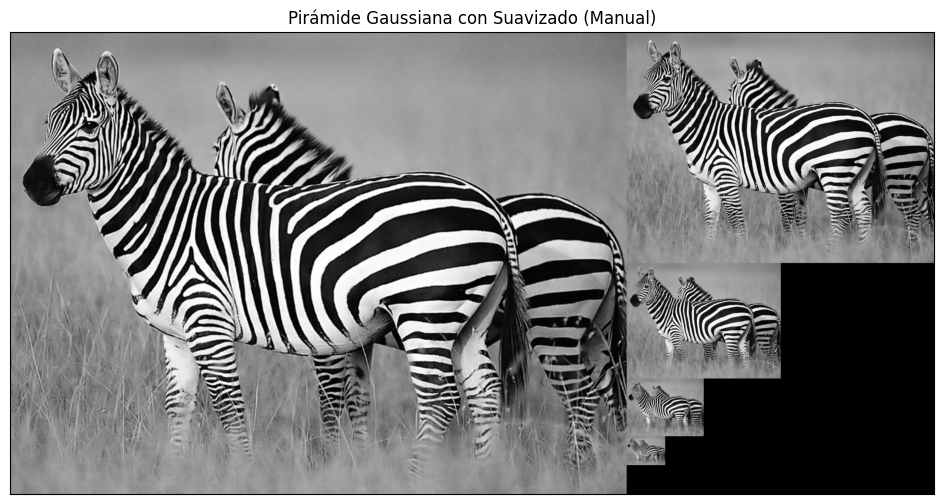

In [19]:
# Función para aplicar suavizado Gaussiano manualmente
def gaussianBlur(im, sizeMask=7):
    sigma = gauss_sigma_from_size(sizeMask=sizeMask)
    kernel_1d = gaussianMask1D(sigma=sigma, sizeMask=sizeMask, order=0)

    # Aplicar convolución separable 1D en ambas direcciones
    blurred = convolve2D(im, kernel_1d, kernel_1d)

    return my2DConv(im, sigma, [0,0])

# Función para realizar el submuestreo de la imagen
def downsample(im):
    # Tomar cada segundo pixel (reducción de resolución a la mitad)
    return im[::2, ::2]


# Función para crear una pirámide Gaussiana con suavizado
def pyramidGauss(im, sizeMask=7, nlevel=4):
    pyramid = [im]  # Primer nivel es la imagen original

    # Crear la pirámide Gaussiana con suavizado
    for i in range(1, nlevel+1):
        blurred = gaussianBlur(pyramid[-1], sizeMask)  # Suavizado manual
        downsampled = downsample(blurred)  # Submuestrear manualmente
        pyramid.append(downsampled)

    return pyramid

# Cargar la imagen en escala de grises
im=cv2.imread(get_image('zebra.jpg'),0)

# Crear la pirámide Gaussiana suavizada
pyrG = pyramidGauss(im, sizeMask=7, nlevel=4)

# Visualizar la pirámide Gaussiana
displayPyramid(pyrG, title='Pirámide Gaussiana con Suavizado (Manual)')


**Análisis de los resultados:**

En la imagen resultante de la pirámide gaussiana con suavizado manual, podemos observar los diferentes niveles de la pirámide, donde:

- Nivel 0 (Imagen original): La imagen tiene todos los detalles nítidos. Es la imagen de mayor resolución y sirve como base para la pirámide.

- Nivel 1: Esta imagen muestra una ligera reducción en la nitidez y resolución. Esto se debe a la aplicación del suavizado gaussiano y posterior submuestreo, que elimina algunos de los detalles más finos. Aún así, la forma general y las características principales de la imagen (como las rayas de la cebra) siguen siendo claras.

- Nivel 2: Aquí, la imagen ha sido aún más suavizada y reducida. Se pueden notar menos detalles en las rayas de la cebra y en el fondo, lo que indica que las altas frecuencias (detalles finos) están siendo eliminadas. La imagen tiene una resolución más baja.

- Nivel 3: En este nivel, la resolución se ha reducido aún más, y los detalles finos, como las rayas, son difíciles de distinguir. Solo quedan las formas generales de la cebra.

- Nivel 4: Este es el nivel más bajo de la pirámide. La imagen ha perdido casi todos los detalles, y solo las formas más grandes y globales son visibles. Esta es la imagen más borrosa y con la menor resolución.


**Interpretación:**
- Suavizado y Submuestreo: Cada nivel de la pirámide aplica un suavizado gaussiano seguido de un submuestreo. A medida que descendemos por la pirámide, los detalles de alta frecuencia (como los bordes y las rayas de la cebra) se pierden progresivamente, lo que da lugar a imágenes más borrosas y de menor tamaño. Esta técnica es útil en procesamiento de imágenes, particularmente para reducir la cantidad de datos o para análisis multiescala.

- Distribución de la Pirámide: En la visualización, podemos ver cómo cada nivel está alineado en una estructura piramidal, con la imagen original en la parte superior izquierda y las imágenes suavizadas/submuestreadas hacia la derecha y hacia abajo.

## B) (1 punto)

Use su código del apartado anterior para implementar una función que permita construir una pirámide Laplaciana de 4 niveles.

**Función upsample_manual(im):**

Esta función realiza la expansión (upsample) de una imagen duplicando las filas y columnas y realizando interpolación entre los valores para calcular los píxeles que se encuentran entre medias.
Se realizan tres tipos de interpolación:
Vertical: Se calculan los valores intermedios entre las filas originales.
Horizontal: Se calculan los valores entre las columnas originales.
Diagonal: Se calcula el valor intermedio entre filas y columnas.

**Función pyramidLap(im, sizeMask, nlevel):**

Esta función construye la pirámide Laplaciana basándose en una pirámide Gaussiana previamente generada.
En cada iteración de la pirámide Laplaciana, se toma un nivel de la pirámide Gaussiana, se expande al siguiente nivel (con menor resolución) utilizando la función upsample_manual, y luego se resta de la imagen original (o del nivel superior en la pirámide Gaussiana) para obtener la "Laplaciana".
Finalmente, el último nivel de la pirámide Gaussiana se añade tal cual como parte de la pirámide Laplaciana, ya que no hay un siguiente nivel con el que compararlo.

In [20]:
def upsampling(im):
    """
    Realiza el proceso de upsampling (aumento de tamaño) de una imagen, duplicando su resolución en ambas dimensiones
    y aplicando un suavizado para interpolar los píxeles faltantes.

    Parameters:
    - im (numpy array): Imagen de entrada a aumentar.

    Returns:
    - upsampled (numpy array): Imagen resultante después de aplicar upsampling y suavizado.
    """

    # Obtener las dimensiones de la imagen de entrada (altura y ancho)
    h, w = im.shape

    # Inicializar la imagen de salida con ceros, duplicando la resolución en ambas dimensiones
    upsampled = np.zeros((2*h, 2*w), dtype=im.dtype)

    # Colocar los píxeles originales en posiciones pares (las mismas que en la imagen original)
    upsampled[::2, ::2] = im

    # Interpolación vertical: se rellenan las filas impares con la fila original superior
    upsampled[1::2, ::2] = np.vstack((im[:-1, :], im[-1, :]))

    # Interpolación horizontal: se rellenan las columnas impares con la columna original a la izquierda
    upsampled[::2, 1::2] = np.hstack((im[:, :-1], im[:, -1:]))

    # Interpolación diagonal: se rellenan las posiciones de los píxeles faltantes utilizando la información de los píxeles
    # superiores e izquierdos, creando un patrón de interpolación diagonal
    upsampled[1::2, 1::2] = np.vstack((np.hstack((im[:-1, :-1], im[:-1, -1:])), im[-1, :]))

    # Suavizar la imagen resultante para eliminar artefactos y transiciones bruscas
    return gaussianBlur(upsampled, sizeMask=5)


In [21]:

# Función para crear la pirámide Laplaciana
def pyramidLap(im, sizeMask, nlevel=4):
   # Construir la pirámide Gaussiana a partir de la imagen original
    pyrGaus = pyramidGauss(im, sizeMask, nlevel)

    # Inicializar la lista para almacenar los niveles de la pirámide Laplaciana
    pyrLap = []

    # Construir cada nivel de la pirámide Laplaciana
    for i in range(nlevel):
        # Aumentar el tamaño del siguiente nivel de la pirámide Gaussiana (upsampling)
        upsampled = upsampling(pyrGaus[i + 1])

        # Convertir los niveles a tipo float32 para realizar la resta con precisión
        upsampled = upsampled.astype(np.float32)
        current_level = pyrGaus[i].astype(np.float32)

        # Calcular la diferencia entre el nivel actual y el nivel aumentado para obtener el nivel Laplaciano
        laplacian = cv2.subtract(current_level, upsampled)

        # Añadir el nivel Laplaciano a la lista
        pyrLap.append(laplacian)

    # Añadir el último nivel de la pirámide Gaussiana, que representa la base de la pirámide Laplaciana
    pyrLap.append(pyrGaus[-1].astype(np.float32))

    return pyrLap

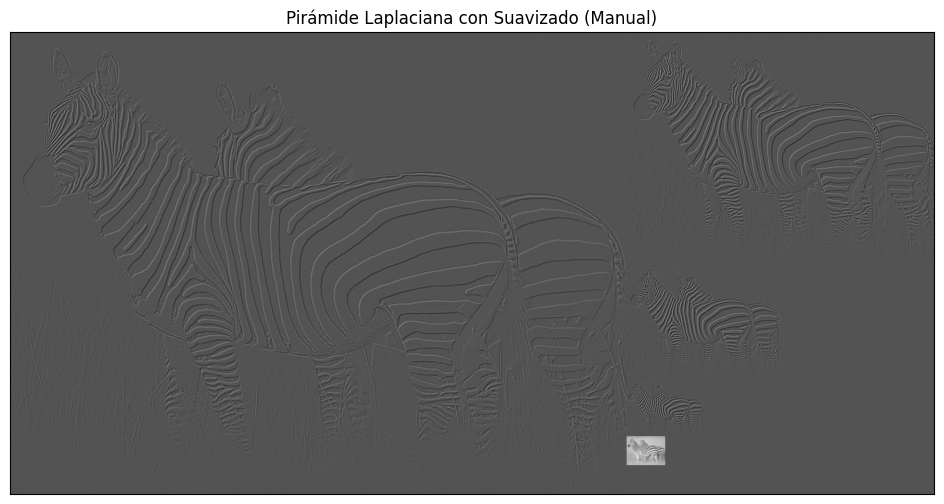

In [22]:
im3=cv2.imread(get_image('zebra.jpg'),0)

# Crear la pirámide Laplaciana
lap_pyr = pyramidLap(im3, sizeMask=7, nlevel=4)

# Visualizar la pirámide Laplaciana usando la función displayPyramid para mostrar cada nivel de la pirámide.
displayPyramid(lap_pyr, title='Pirámide Laplaciana con Suavizado (Manual)')


**Análisis del resultado:**

En niveles superiores, que son de mayor resolución, se ven más detalles. Aquí, la Laplaciana resalta las diferencias entre las versiones suavizadas y las imágenes originales, mostrando los bordes y cambios más finos de la imagen.
A medida que se desciende en la pirámide (niveles de menor resolución), se van eliminando detalles finos y se retiene solo la información de baja frecuencia de la imagen.

El último nivel de la pirámide contiene una versión extremadamente suavizada de la imagen.

**Observaciones sobre los resultados:**
Detalles finos: Se puede ver cómo los bordes de las cebras se destacan más en los primeros niveles de la pirámide (niveles con más detalle). Estos detalles corresponden a las diferencias más finas entre una imagen suavizada y su versión original.

Interpolación: La interpolación manual usada en la función upsample_manual puede generar resultados algo diferentes respecto a métodos más sofisticados (como el cv2.resize), pero con el suavizado Gaussiano aplicado después, los resultados tienden a acercarse bastante al comportamiento esperado.


## C) (0.5 puntos)

Ahora realice la misma operación que en los apartados anteriores, pero sin suavizar antes de hacer subsampling a la hora de crear la pirámide Gaussiana. ¿Hay diferencias visuales en la pirámide Laplaciana generada? ¿A qué se pueden deber estas?

Este código implementa la creación de una pirámide Gaussiana sin aplicar suavizado previo antes de realizar el submuestreo (subsampling). Posteriormente, se construye la pirámide Laplaciana a partir de esta pirámide Gaussiana, pero de nuevo, sin suavizar antes del submuestreo. Esto contrasta con la implementación anterior donde se aplicaba un suavizado Gaussiano antes de reducir la resolución de la imagen.


**Función upsample_manual(im):**

Esta función expande la imagen duplicando los píxeles en las posiciones correctas, sin aplicar interpolación ni suavizado. Básicamente, se duplica el valor del píxel para generar una versión ampliada de la imagen.
Función pyramidGaussNoBlur(im, nlevel):

Se crea una pirámide Gaussiana sin suavizado. Para cada nivel de la pirámide, simplemente se realiza el submuestreo de la imagen original sin suavizarla previamente. Esto genera una reducción de la resolución (a la mitad en cada nivel), pero sin eliminar las altas frecuencias presentes en la imagen (detalles finos, ruido, etc.).

**Función pyramidLapNoBlur(im, sizeMask, nlevel):**

Esta función genera la pirámide Laplaciana utilizando la pirámide Gaussiana creada en el paso anterior, que no ha sido suavizada. Se expande cada nivel reducido de la pirámide Gaussiana y se resta del nivel inmediatamente superior para obtener los detalles.
La última imagen en la pirámide Laplaciana es simplemente la imagen de menor resolución de la pirámide Gaussiana, sin modificaciones.


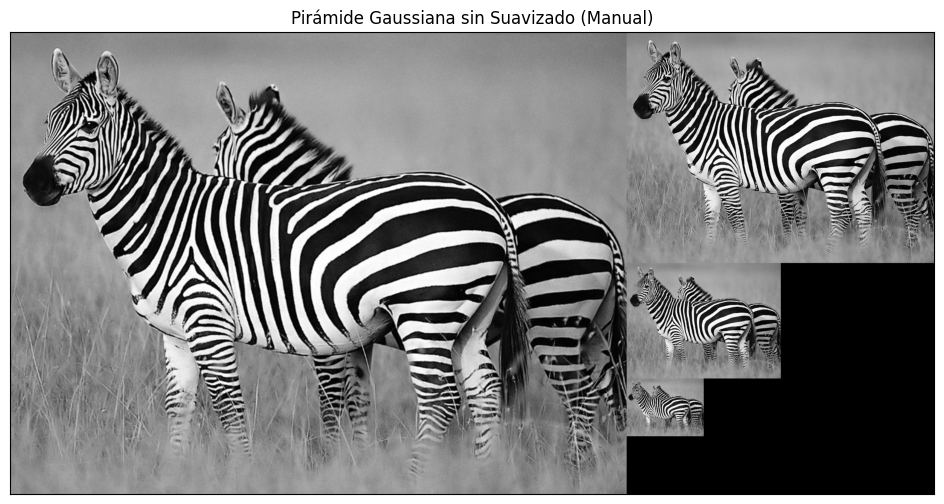

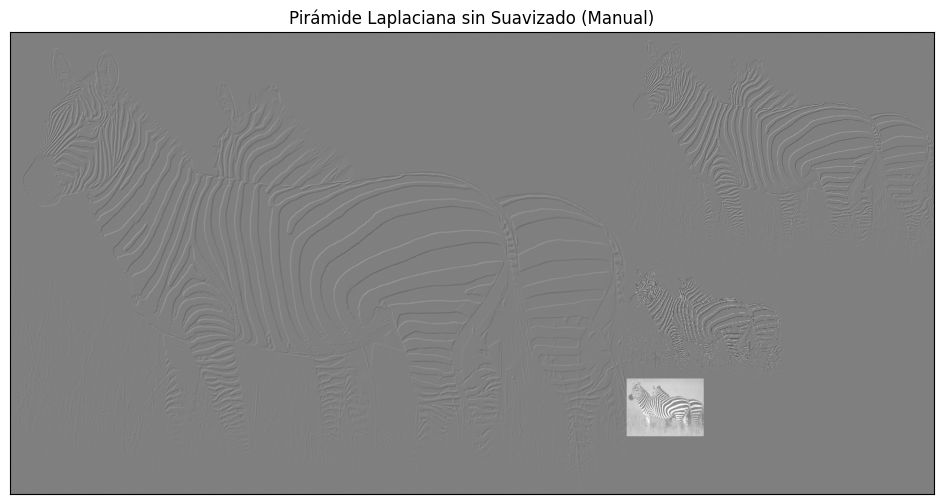

In [23]:
# Función para hacer la expansión manual (upsample)
def upsample_manual(im):
    new_im = np.zeros((im.shape[0] * 2, im.shape[1] * 2), dtype=im.dtype)

    # Copiar los valores en las posiciones correctas
    new_im[::2, ::2] = im
    new_im[1::2, ::2] = im
    new_im[::2, 1::2] = im
    new_im[1::2, 1::2] = im

    return new_im

    # Función para crear la pirámide Gaussiana sin suavizado
def pyramidGaussNoBlur(im, nlevel=4):
    pyramid = [im]  # Primer nivel es la imagen original

    # Crear la pirámide Gaussiana sin suavizar
    for i in range(1, nlevel):
        downsampled = downsample(pyramid[-1])  # Submuestrear manualmente sin suavizar
        pyramid.append(downsampled)

    return pyramid

# Crear la pirámide Gaussiana sin suavizado
pyrG_no_blur = pyramidGaussNoBlur(im, nlevel=4)

# Visualizar la pirámide Gaussiana sin suavizado
displayPyramid(pyrG_no_blur, title='Pirámide Gaussiana sin Suavizado (Manual)')
# Función para crear la pirámide Laplaciana sin suavizado previo
def pyramidLapNoBlur(im, sizeMask, nlevel=4):
    gauss_pyr = pyramidGaussNoBlur(im, nlevel)  # Generar pirámide Gaussiana sin suavizado
    laplacian_pyr = []

    for i in range(nlevel - 1):
        # Expandir el siguiente nivel Gaussiano manualmente
        expanded_next_level = upsample_manual(gauss_pyr[i+1])
        expanded_next_level = expanded_next_level[:gauss_pyr[i].shape[0], :gauss_pyr[i].shape[1]]

        # Restar el siguiente nivel expandido del nivel actual
        current_level = gauss_pyr[i].astype(np.float32)
        expanded_next_level = expanded_next_level.astype(np.float32)

        laplacian = cv2.subtract(current_level, expanded_next_level)
        laplacian_pyr.append(laplacian)

    # Añadir el último nivel Gaussiano sin modificar
    laplacian_pyr.append(gauss_pyr[-1].astype(np.float32))

    return laplacian_pyr

# Crear la pirámide Laplaciana sin suavizado
lap_pyr_no_blur = pyramidLapNoBlur(im, sizeMask=7, nlevel=4)

# Visualizar la pirámide Laplaciana sin suavizado
displayPyramid(lap_pyr_no_blur, title='Pirámide Laplaciana sin Suavizado (Manual)')


1. Pirámide Gaussiana sin Suavizado:
Observación: En la pirámide Gaussiana, los niveles reducidos de la imagen muestran más artefactos y detalles de alta frecuencia. En las imágenes reducidas, hay una pérdida notable de calidad y se aprecian bordes dentados (aliasing), lo que es un indicativo claro de que no se ha aplicado un filtro de suavizado antes de realizar el submuestreo.

Razón: Cuando no se aplica suavizado antes del submuestreo, las altas frecuencias (detalles finos) de la imagen original permanecen y se mezclan en los niveles más bajos de la pirámide, lo que provoca aliasing. El suavizado previo a la reducción de tamaño normalmente elimina estas frecuencias altas, evitando estos artefactos.

2. Pirámide Laplaciana sin Suavizado:
Observación: La pirámide Laplaciana generada sin suavizado previo muestra artefactos más evidentes en los niveles de mayor resolución. Se nota que las transiciones y los bordes son más bruscos, especialmente en las zonas de alto contraste de la imagen original (como las rayas de la cebra).

Razón: Al no suavizar la imagen antes de realizar el submuestreo, el cálculo de las diferencias entre los niveles de la pirámide Gaussiana no refleja adecuadamente los cambios graduales en la imagen, lo que da como resultado artefactos en la Laplaciana. Esto sucede porque las diferencias entre los niveles de la pirámide Gaussiana incluyen frecuencias altas no deseadas.

**Conclusión:**

Suavizado: El suavizado es crucial antes de realizar submuestreo porque ayuda a eliminar frecuencias altas que de otra manera generarían aliasing y artefactos en los niveles inferiores de la pirámide.
Diferencias: Las diferencias visuales entre las pirámides con y sin suavizado son evidentes. En el caso sin suavizado, la pirámide pierde suavidad y muestra más artefactos. En el contexto de la pirámide Laplaciana, esto impacta directamente en la precisión de los bordes y los detalles de las diferencias entre niveles.


## D) (0.5 puntos)

Implemente ahora una función para reconstruir la imagen codificada en la pirámide Laplaciana del apartado 2.B. Verifique que es posible obtener una copia exacta de la imagen original. Para ello, calcule el error de reconstrucción como el _Root Mean Squared Error_ (RMSE) entre los niveles de intensidad de la imagen original y la imagen reconstruida.

###Función reconstruct_pyrLap_with_steps(pyL)

Esta función reconstruye la imagen original a partir de una pirámide Laplaciana pyL en un enfoque de reconstrucción paso a paso.

- Inicialización: La reconstrucción comienza en el último nivel de la pirámide Laplaciana (pyL[-1]), que representa la versión de menor resolución de la imagen.
- Recorrido Inverso de la Pirámide: Para cada nivel, se aplica upsampling a la imagen reconstruida hasta ese punto.
- Ajuste de tamaño: Dado que upsampling puede no coincidir perfectamente con el tamaño de cada nivel de la pirámide, se ajusta el tamaño de la imagen ampliada upsampled recortando o rellenando, para que coincida con las dimensiones del nivel actual (pyL[-i - 2]).

- Sumatoria con el nivel actual: La imagen ajustada se suma con el nivel Laplaciano correspondiente para reconstruir los detalles a esa escala.

- Registro de cada paso: Cada paso de reconstrucción se guarda en una lista steps para visualización.

- Retorno: La función devuelve la imagen reconstruida im y la lista de pasos intermedios steps.

In [24]:
# Función para reconstruir la pirámide Laplaciana con pasos intermedios, sin usar cv2.resize
def reconstruct_pyrLap_with_steps(pyL):
    """
    Reconstruye la imagen original a partir de una pirámide Laplaciana y guarda cada paso de reconstrucción en una lista,
    ajustando manualmente las dimensiones de cada paso de upsampling.
    """
    # Iniciar la reconstrucción desde el último nivel de la pirámide Laplaciana (nivel de menor resolución)
    im = pyL[-1]
    steps = [im]  # Lista para almacenar cada paso de la reconstrucción

    # Recorrer la pirámide Laplaciana en orden inverso para reconstruir la imagen
    for i in range(len(pyL) - 1):
        # Aplicar upsampling a la imagen reconstruida actual
        upsampled = upsampling(im)

        # Ajuste de tamaño: recortar o rellenar la imagen ampliada para que coincida con la dimensión de pyL[-i - 2]
        target_shape = pyL[-i - 2].shape
        if upsampled.shape != target_shape:
            upsampled = upsampled[:target_shape[0], :target_shape[1]]

        # Sumar el nivel Laplaciano correspondiente para obtener la reconstrucción en el nivel actual
        im = upsampled + pyL[-i - 2]

        # Almacenar el paso actual en la lista de pasos
        steps.append(im)

    return im, steps

###Funcion auxiliar para visualizacion

In [25]:
# Función para mostrar las imágenes en un mosaico
def displayImagesInMosaic(images, titles):
    plt.figure(figsize=(18, 10))
    for i in range(len(images)):
        plt.subplot(2, 3, i + 1)
        plt.imshow(images[i], cmap='gray')
        plt.title(titles[i])
        plt.axis('off')
    plt.tight_layout()
    plt.show()


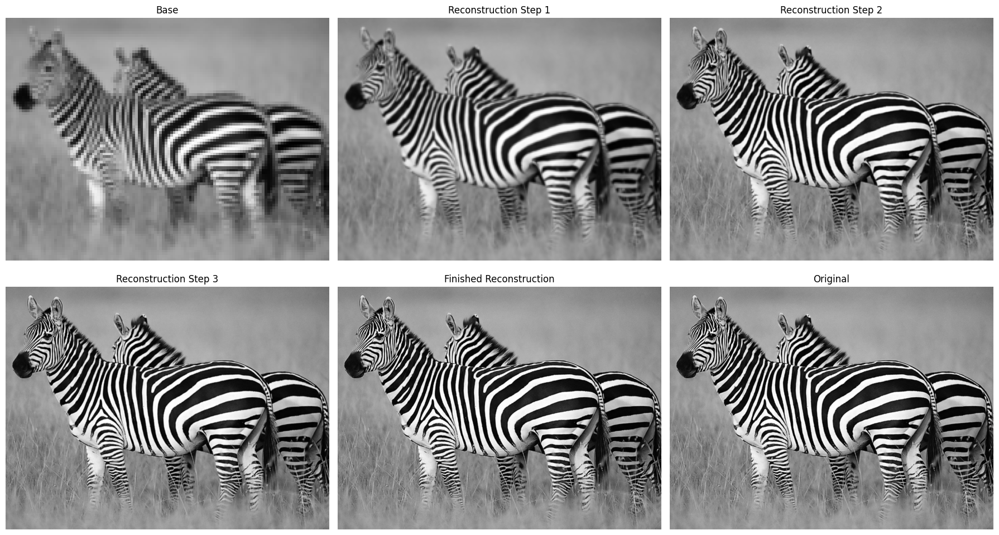

Error per pixel 0.0


In [26]:
# Cargar la imagen original en escala de grises
im = cv2.imread(get_image('zebra.jpg'), 0)  # Cargar la imagen original en escala de grises

lap_pyr = pyramidLap(im, sizeMask=7, nlevel=4)

# Reconstruir la imagen y obtener los pasos intermedios
im_recons, reconstruction_steps = reconstruct_pyrLap_with_steps(lap_pyr)

# Añadir la imagen original para comparar al final
reconstruction_steps.append(im)

# Mostrar los pasos de reconstrucción en un mosaico
titles = ['Base', 'Reconstruction Step 1', 'Reconstruction Step 2', 'Reconstruction Step 3', 'Finished Reconstruction', 'Original']
displayImagesInMosaic(reconstruction_steps, titles)

# Calcular el RMSE entre la imagen original y la reconstruida
error_per_pixel = np.sqrt(np.mean((im - np.round(im_recons)) ** 2))
print('Error per pixel', error_per_pixel)


###Análisis de la Reconstrucción de la Pirámide Laplaciana

A continuación, presentamos un análisis paso a paso de la reconstrucción de la imagen original a partir de la pirámide Laplaciana.

- Base (Nivel más bajo de la pirámide): En este nivel, observamos la versión más borrosa de la imagen, que solo conserva las formas generales de los objetos (las cebras en este caso) sin detalles finos.
Este nivel representa la base de la reconstrucción, sobre la cual se añadirán detalles en los pasos siguientes.

- Reconstruction Step 1: En el primer paso de reconstrucción, algunos detalles adicionales comienzan a emerger, especialmente los contornos de las rayas de las cebras. Aunque la imagen aún está borrosa, este paso añade una capa de información visual que ayuda a definir mejor la estructura general.

- Reconstruction Step 2: En este nivel, se observan más detalles en las rayas y contornos de las cebras, lo que mejora la definición de la imagen.
La imagen en este punto se parece mucho más a la original en términos de contraste y detalles principales.

- Reconstruction Step 3: Este paso agrega aún más detalles, haciendo que la imagen sea aún más nítida.
En este punto, la imagen reconstruida está casi completa y tiene una alta similitud con la imagen original.

- Finished Reconstruction (Reconstrucción Final): Esta imagen muestra el resultado final de la reconstrucción después de haber añadido todos los niveles de la pirámide Laplaciana.
La reconstrucción final es visualmente muy similar a la imagen original y capta los detalles y el contraste de la cebra.

- Original (Imagen de referencia): La imagen original se presenta aquí como una referencia para comparar el resultado de la reconstrucción.
La similitud entre la reconstrucción final y la imagen original es alta, lo cual indica que el proceso de reconstrucción ha sido exitoso.

###Conclusión
  El proceso de reconstrucción de la pirámide Laplaciana ha logrado capturar los detalles de la imagen original de forma efectiva. A medida que avanzamos en los pasos de reconstrucción, se observa una progresiva mejora en la definición de la imagen, añadiendo cada vez más detalles hasta alcanzar una calidad visual similar a la de la imagen original.


# **Ejercicio 3: Imágenes Híbridas** (1.5 puntos)

Este ejercicio se basa en el siguiente trabajo: $\textit{Oliva, A., Torralba, A., & Schyns, P. G. (2006). Hybrid images. ACM Transactions on Graphics (TOG), 25(3), 527-532}$ (https://stanford.edu/class/ee367/reading/OlivaTorralb_Hybrid_Siggraph06.pdf). Vamos a aprender cómo el sistema visual humano extrae información sobre un objeto en función de la distancia. Para ello, construimos una imagen híbrida a partir de dos imágenes de objetos diferentes. Mezclando adecuadamente parte de las altas frecuencias de una imagen con parte de las bajas frecuencias de otra imagen, obtenemos una imagen híbrida que muestra diferentes percepciones con la distancia. El sigma empleado para filtrar ambas imágenes (tanto la de alta como la de bajas frecuencias) es el aspecto clave para seleccionar el rango de frecuencias altas y bajas de cada imagen. Cuanto mayor sea el valor sigma, mayor será la eliminación de altas frecuencias de la imagen. Se recomienda elegir este valor por separado para cada una de las imágenes y, de hecho, seguramente sea posible (y deseable) el tener distintos valores para distintos pares de imágenes.

Aspectos de importancia en relación a este ejercicio:

1. Como mínimo, se deben generar las imágenes híbridas correspondientes a `'cat.bmp'+'dog.bmp'`, `'submarine.bmp'+'fish.bmp'` y `'marilyn.bmp'+'einstein.bmp'` (todas ellas en escala de grises). Se debe emplear una pirámide Gaussiana con 5 niveles para mostrar el efecto obtenido.
2. No es necesario seguir al pie de la letra el artículo de referencia y operar en el dominio de la frecuencia (Fourier). Basta con operar en el dominio del espacio, como hemos hecho en todos los demás apartados de esta práctica.
3. Se debe explicar con claridad el criterio empleado para escoger la imagen de altas y la imagen de bajas frecuencias, así como el proceso seguido para filtrar la imagen de altas frecuencias y la de bajas frecuencias (incluyendo la elección de los sigmas finalmente utilizados; es decir, no sería suficiente indicar sucintamente que "se procedió por medio de prueba y error hasta obtener el sigma final").

La función **hibridarImagen** toma dos imágenes (im1 e im2) y dos valores de sigma (sigma_low para la imagen de bajas frecuencias y sigma_high para la imagen de altas frecuencias).

In [27]:
def hibridarImagen(im1, im2, sigma_low, sigma_high):

  # Suavizado de imagen 1 (amplifica bajas frecuencias)
  im1 = my2DConv(im1,sigma_low,[0,0])

  # Acentuado de imagen 2 (amplifica altas frecuencias)
  im2 = (im2 - my2DConv(im2,sigma_high,[0,0]))

  return (im1 + im2)/2


**sigma_low:**

Este valor determina cuánto se suaviza la imagen de bajas frecuencias. Si el valor es muy pequeño, las altas frecuencias no se eliminan de manera efectiva y la imagen final no tendrá una percepción de profundidad adecuada. Un valor muy alto podría hacer que la imagen de bajas frecuencias pierda detalles importantes.

**sigma_high:**

Este valor controla qué tan agresivamente se eliminan las bajas frecuencias de la imagen 2. Si es muy pequeño, la imagen de altas frecuencias contendrá demasiada información innecesaria, mientras que un valor muy alto podría reducir la imagen de altas frecuencias a ruido.

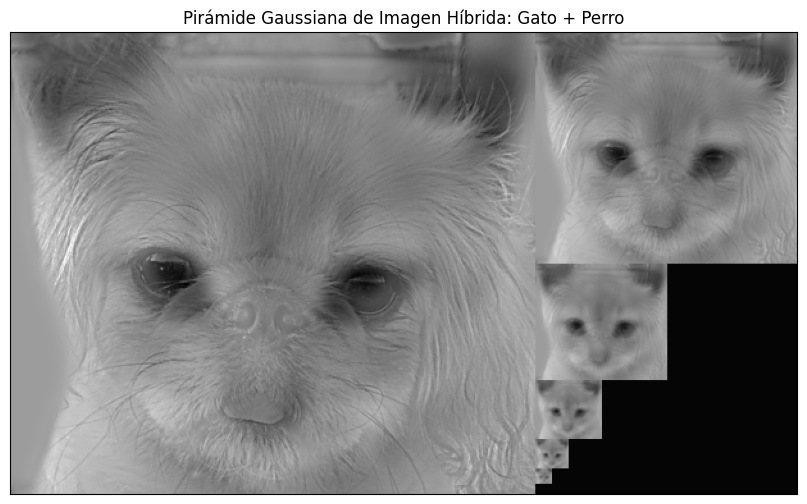

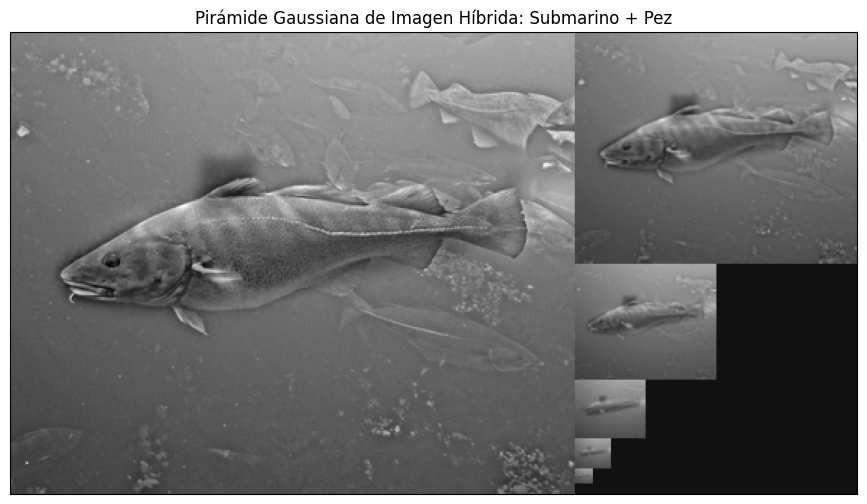

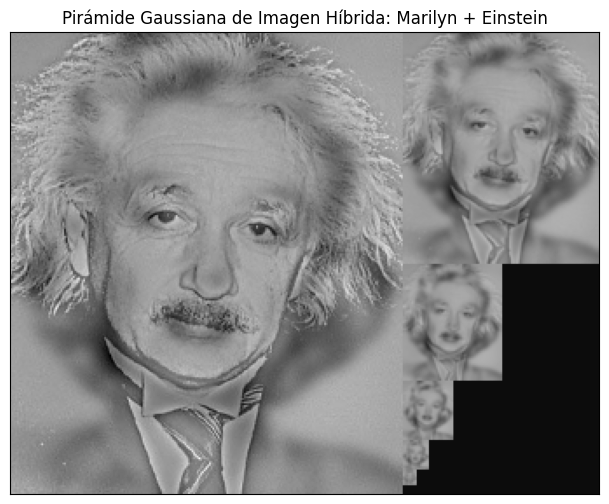

In [28]:
# Cargar las imágenes
image1_cat = cv2.imread(get_image('cat.bmp'), 0)
image2_dog = cv2.imread(get_image('dog.bmp'), 0)

image1_submarine = cv2.imread(get_image('submarine.bmp'), 0)
image2_fish = cv2.imread(get_image('fish.bmp'), 0)

image1_marilyn = cv2.imread(get_image('marilyn.bmp'), 0)
image2_einstein = cv2.imread(get_image('einstein.bmp'), 0)

# Crear la imagen híbrida para cada par de imágenes
hybrid_cat_dog = hibridarImagen(image1_cat, image2_dog, sigma_low=7, sigma_high=3)
hybrid_submarine_fish = hibridarImagen(image1_submarine, image2_fish, sigma_low=4, sigma_high=4)
hybrid_marilyn_einstein = hibridarImagen(image1_marilyn, image2_einstein, sigma_low=4, sigma_high=3)

# Generar las pirámides Gaussianas para cada imagen híbrida
pyr_hybrid_cat_dog = pyramidGauss(hybrid_cat_dog, nlevel=5)
pyr_hybrid_submarine_fish = pyramidGauss(hybrid_submarine_fish, nlevel=5)
pyr_hybrid_marilyn_einstein = pyramidGauss(hybrid_marilyn_einstein, nlevel=5)

# Mostrar las pirámides Gaussianas usando displayPyramid
displayPyramid(pyr_hybrid_cat_dog, title='Pirámide Gaussiana de Imagen Híbrida: Gato + Perro')
displayPyramid(pyr_hybrid_submarine_fish, title='Pirámide Gaussiana de Imagen Híbrida: Submarino + Pez')
displayPyramid(pyr_hybrid_marilyn_einstein, title='Pirámide Gaussiana de Imagen Híbrida: Marilyn + Einstein')

**Comentarios sobre los resultados obtenidos con el método clásico de hibridación**

En las imágenes híbridas generadas con el método clásico (sin utilizar Fourier), se observan las siguientes características:

- Imagen híbrida "Gato + Perro":

    - A corta distancia, la imagen del perro es predominante, lo que sugiere que se están preservando las bajas frecuencias de esta imagen.
    - A medida que nos alejamos o reducimos la imagen, las altas frecuencias del gato emergen, haciéndolo más visible. Esto demuestra cómo las frecuencias altas del gato están superpuestas a las bajas frecuencias del perro.
        - El resultado es coherente con el comportamiento esperado de las imágenes híbridas: cerca se aprecia un objeto (perro) y lejos, otro (gato).

- Imagen híbrida "Submarino + Pez":
  - Aquí, a corta distancia, la imagen del submarino domina debido a las bajas frecuencias de esta imagen.
  - Cuando se visualiza de lejos, se distingue más el pez debido a las altas frecuencias de la imagen del pez que fueron amplificadas en el proceso.
    - Esta combinación también demuestra claramente la interacción entre frecuencias bajas y altas, lo cual es fundamental en la creación de imágenes híbridas.

- Imagen híbrida "Marilyn + Einstein":

    - En esta combinación, a corta distancia se aprecia Einstein con más claridad, destacando las bajas frecuencias de su rostro.
    - A medida que reducimos o nos alejamos de la imagen, las características de Marilyn Monroe comienzan a aparecer, destacando las altas frecuencias de la imagen de Marilyn.
    - Este resultado es un excelente ejemplo de cómo el sistema visual humano interpreta diferentes rangos de frecuencia a distintas distancias.


En el próximo apartado, utilizaremos esta técnica para generar imágenes híbridas aplicando filtros de paso bajo y paso alto directamente en el dominio frecuencial mediante la transformada de Fourier.

**Introducción al método de hibridación con Fourier**

En el siguiente apartado, mejoraremos el proceso de hibridación implementando la transformada de Fourier.

Esta técnica nos permitirá trabajar directamente en el dominio de las frecuencias, lo que ofrece más control sobre la separación y manipulación de las frecuencias bajas y altas.

El uso de la transformada de Fourier en lugar de convoluciones espaciales clásicas ofrece ventajas importantes:

- Control más preciso sobre las frecuencias: En el dominio de Fourier, podemos diseñar filtros de paso bajo y alto con mayor precisión, ajustando el corte de frecuencias de manera directa.
  - Esto puede producir una hibridación más refinada, especialmente cuando las imágenes requieren ajustes de frecuencia más específicos.

- Eficiencia en el filtrado: Filtrar imágenes en el dominio de Fourier puede ser más eficiente cuando se trata de imágenes grandes, ya que la convolución en el espacio puede ser más costosa computacionalmente.

- Flexibilidad en la manipulación de frecuencias: El uso de Fourier facilita la aplicación de transformaciones adicionales, como modificar el contenido de frecuencia en diferentes partes de la imagen sin afectar el espacio global, lo cual sería más difícil de lograr en el espacio de las convoluciones tradicionales.

In [29]:
# Función para crear un filtro Gaussiano de paso bajo en el dominio frecuencial
def gaussian_low_pass_filter(shape, sigma):
    # Extraer las dimensiones de la imagen (número de filas y columnas)
    rows, cols = shape
    # Definir el centro del espectro de Fourier (donde se colocan las frecuencias bajas)
    crow, ccol = rows // 2 , cols // 2

    # Crear un rango de valores para las coordenadas X e Y, centrado en el origen
    x = np.arange(cols) - ccol
    y = np.arange(rows) - crow

    # Generar una malla 2D (X, Y) que representa las coordenadas en el dominio frecuencial
    X, Y = np.meshgrid(x, y)

    # Crear el filtro gaussiano aplicando la fórmula de la Gaussiana en 2D
    gauss = np.exp(- (X**2 + Y**2) / (2 * sigma**2))

    # Retornar el filtro Gaussiano de paso bajo
    return gauss

# Función para crear un filtro Gaussiano de paso alto en el dominio frecuencial
def gaussian_high_pass_filter(shape, sigma):
    # Un filtro de paso alto se puede generar restando el filtro de paso bajo de 1.
    return 1 - gaussian_low_pass_filter(shape, sigma)

# Función para convertir la imagen al dominio de la frecuencia
def image_to_frequency(im):
    # Aplicar la Transformada de Fourier bidimensional a la imagen y desplazar el espectro a su centro
    return np.fft.fftshift(np.fft.fft2(im))

# Función para convertir la imagen de vuelta al dominio espacial
def frequency_to_image(freq_im):
    # Aplicar la Transformada Inversa de Fourier y devolver el valor absoluto de la imagen recuperada
    return np.abs(np.fft.ifft2(np.fft.ifftshift(freq_im)))

# Función para hibridar imágenes usando la transformada de Fourier
def hibridarImagen_Fourier(im1, im2, sigma_low, sigma_high):
    # Convertir la primera imagen al dominio de la frecuencia utilizando la Transformada de Fourier
    freq1 = image_to_frequency(im1)
    # Convertir la segunda imagen al dominio de la frecuencia
    freq2 = image_to_frequency(im2)

    # Crear el filtro de paso bajo para la primera imagen (bajas frecuencias)
    low_pass = gaussian_low_pass_filter(im1.shape, sigma_low)
    # Crear el filtro de paso alto para la segunda imagen (altas frecuencias)
    high_pass = gaussian_high_pass_filter(im2.shape, sigma_high)

    # Aplicar el filtro de paso bajo multiplicando el espectro de Fourier de la primera imagen con el filtro
    freq1_low = freq1 * low_pass

    # Aplicar el filtro de paso alto multiplicando el espectro de Fourier de la segunda imagen con el filtro
    freq2_high = freq2 * high_pass

    # Convertir la primera imagen filtrada de vuelta al dominio espacial (bajas frecuencias)
    im1_low = frequency_to_image(freq1_low)
    # Convertir la segunda imagen filtrada de vuelta al dominio espacial (altas frecuencias)
    im2_high = frequency_to_image(freq2_high)

    # Combinar las dos imágenes sumando sus componentes y dividiendo por 2 para suavizar la mezcla
    hybrid_image = (im1_low + im2_high) / 2

    # Normalizar la imagen resultante para asegurar que los valores de píxel estén en el rango [0, 255]
    hybrid_image = np.clip(hybrid_image, 0, 255)

    # Devolver la imagen híbrida final
    return hybrid_image


**Explicación general del código:**

- Filtros Gaussianos en el dominio frecuencial:

  -Se crean dos tipos de filtros Gaussianos: uno de paso bajo y otro de paso alto.
  - El filtro de paso bajo permite pasar las frecuencias bajas de la imagen (elimina detalles), mientras que el filtro de paso alto permite pasar solo las frecuencias altas (detalles y bordes).
  - Estos filtros se crean directamente en el dominio de Fourier utilizando la ecuación de la Gaussiana en 2D, donde sigma determina el tamaño del área que es afectada por el filtro.
- Transformada de Fourier:
  - Las imágenes son convertidas al dominio de la frecuencia utilizando la Transformada de Fourier, que descompone la imagen en sus componentes de frecuencia. El espectro de frecuencias se desplaza de manera que el centro contiene las frecuencias bajas.
  - Después de filtrar las frecuencias (con los filtros de paso bajo o alto), las imágenes son reconvertidas al dominio espacial mediante la Transformada Inversa de Fourier.
- Proceso de hibridación:
  - Se aplica el filtro de paso bajo a la primera imagen para preservar solo las bajas frecuencias.
  - Se aplica el filtro de paso alto a la segunda imagen para preservar solo las altas frecuencias.
  - Las imágenes filtradas se combinan (sumándolas y promediando) para crear una imagen híbrida que contiene las bajas frecuencias de la primera imagen y las altas frecuencias de la segunda.
- Normalización:
  Finalmente, la imagen resultante es normalizada para que todos sus valores de píxel estén en el rango [0, 255], asegurando que sea visualizable correctamente.

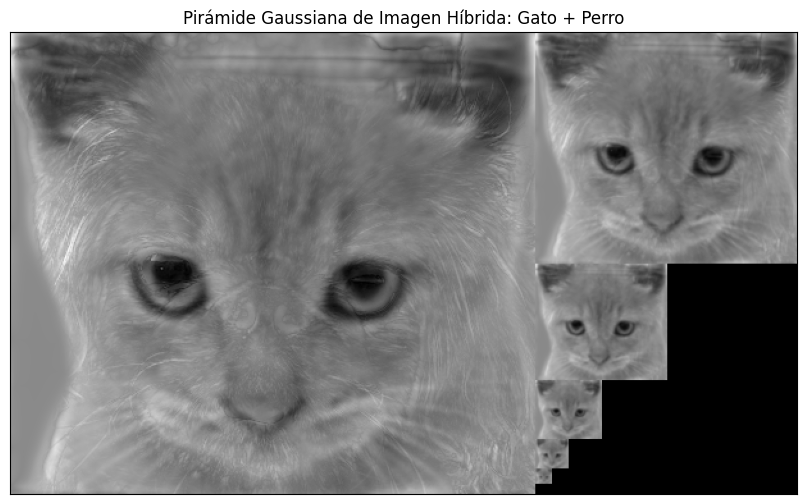

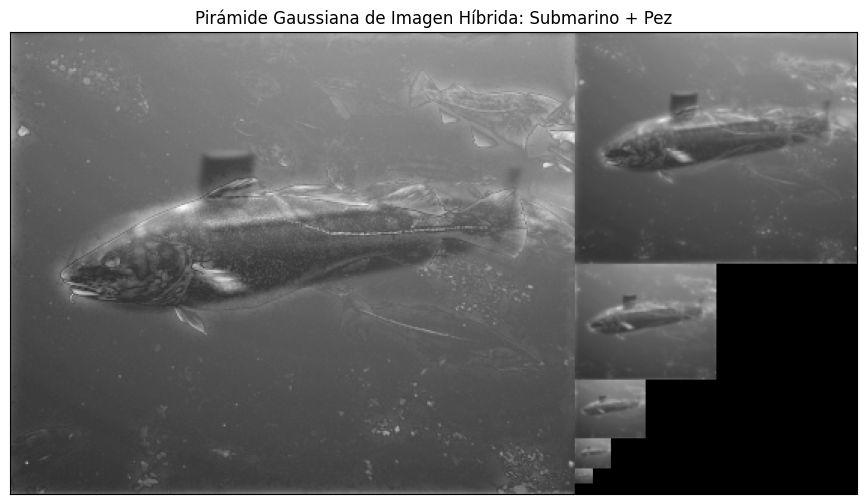

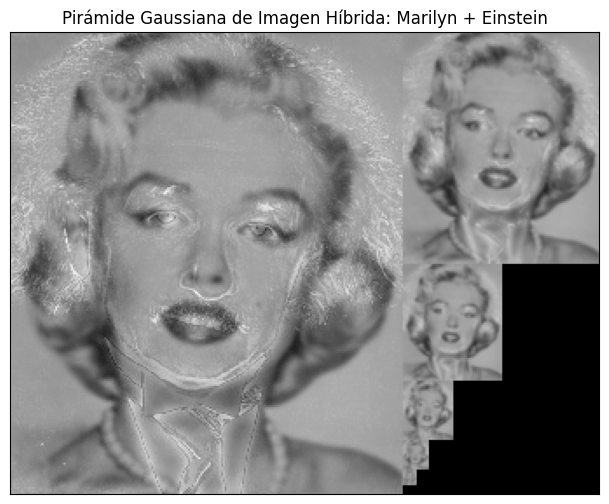

In [30]:
# Crear la imagen híbrida para cada par de imágenes
hybrid_cat_dog = hibridarImagen_Fourier(image1_cat,image2_dog, sigma_low=30, sigma_high=10)
hybrid_submarine_fish = hibridarImagen_Fourier(image1_submarine,image2_fish,sigma_low=30, sigma_high=10)
hybrid_marilyn_einstein = hibridarImagen_Fourier(image1_marilyn, image2_einstein,  sigma_low=30, sigma_high=10)

# Generar las pirámides Gaussianas para cada imagen híbrida
pyr_hybrid_cat_dog = pyramidGauss(hybrid_cat_dog, nlevel=5)
pyr_hybrid_submarine_fish = pyramidGauss(hybrid_submarine_fish, nlevel=5)
pyr_hybrid_marilyn_einstein = pyramidGauss(hybrid_marilyn_einstein, nlevel=5)

# Mostrar las pirámides Gaussianas usando displayPyramid
displayPyramid(pyr_hybrid_cat_dog, title='Pirámide Gaussiana de Imagen Híbrida: Gato + Perro')
displayPyramid(pyr_hybrid_submarine_fish, title='Pirámide Gaussiana de Imagen Híbrida: Submarino + Pez')
displayPyramid(pyr_hybrid_marilyn_einstein, title='Pirámide Gaussiana de Imagen Híbrida: Marilyn + Einstein')

**Comentarios sobre los resultados:**
- Gato + Perro:
  - Imagen Global (Bajas Frecuencias): La parte dominante en la imagen a distancia parece ser el perro. Esto es consistente con el hecho de que has filtrado las bajas frecuencias del perro, las cuales predominan cuando se observa la imagen desde lejos.
  - Imagen Detallada (Altas Frecuencias): Al observar más de cerca, las características del gato son visibles, especialmente en detalles como los ojos. Estas características se destacan debido a que filtraste las altas frecuencias del gato, lo que hace que los bordes y los detalles finos se mantengan presentes.
  - Pirámide Gaussiana: A medida que reduces la resolución, las características del gato se vuelven menos predominantes, mientras que el perro domina cada vez más la imagen.

- Submarino + Pez:
  - Imagen Global (Bajas Frecuencias): El submarino es claramente visible desde lejos, lo que significa que el filtrado de bajas frecuencias del submarino está funcionando correctamente. Los contornos suaves del submarino dominan la percepción.
  - Imagen Detallada (Altas Frecuencias): Cuando te acercas, el pez comienza a ser visible, pero parece que hay cierta fusión entre ambos objetos que genera algunos artefactos. Esto podría deberse a una elección subóptima de los sigmas, o a que las texturas del pez y el submarino no contrastan tanto como otros pares de imágenes.
  - Pirámide Gaussiana: Como ocurre en los otros ejemplos, en los niveles más bajos de la pirámide, el submarino es más dominante, mientras que los detalles del pez se van perdiendo.
- Marilyn + Einstein:
  - Imagen Global (Bajas Frecuencias): Desde lejos, se puede ver principalmente el rostro de Einstein. Esto es consistente con el filtro de paso bajo aplicado a su imagen. Sus rasgos suaves, como el contorno de la cara y el cabello, predominan cuando se observa desde lejos.
  - Imagen Detallada (Altas Frecuencias): De cerca, las características de Marilyn se destacan, especialmente en los detalles de sus labios y ojos, donde las altas frecuencias capturan bordes y detalles finos.
  - Pirámide Gaussiana: En los niveles inferiores de la pirámide, la imagen de Einstein domina claramente, mientras que Marilyn es más visible en los niveles superiores, cuando los detalles aún no han sido completamente suavizados.



**Conclusión:**

El uso de la Transformada de Fourier ha generado resultados interesantes, pero quizás la fusión de las imágenes no es tan suave como en la versión espacial. La elección de los sigmas para el filtrado de altas y bajas frecuencias es crucial en este proceso y debe ajustarse cuidadosamente para lograr un balance adecuado entre las dos imágenes. En este caso, los resultados parecen algo más ruidosos en comparación con la versión sin Fourier, y algunos detalles, especialmente en el caso del Submarino + Pez, podrían beneficiarse de un ajuste más fino en los filtros.

De todas formas, el efecto de imágenes híbridas es claro y consistente: desde lejos, predominan las bajas frecuencias (imagen global) y, al acercarse, las altas frecuencias (detalles) de la segunda imagen se vuelven más visibles.

# **Ejercicio 4: Pyramid Blending** (1 punto)

En este ejercicio se debe crear la imagen fusionada de la manzana (`apple.jpg`; parte superior de la imagen fusionada final) y la naranja (`orange.jpg`; parte inferior de la imagen fusionada final) empleando la técnica de $\textit{Pyramid Blending}$. Para este ejercicio, si se desea, sí se pueden emplear las funciones de OpenCV `pyrDown` y `pyrUp`.

Se debe:
1. explicar en detalle el proceso seguido a la hora de crear la nueva imagen (mezcla de ambas);
2. comparar el resultado con la combinación de las imágenes sin emplear _blending_, es decir, juntando directamente los píxeles de la mitad superior de una imagen con la mitad inferior de la otra;
3. mostrar los estados intermedios del procesado. Es decir, las pirámides Gaussianas calculadas para cada imagen (5 niveles cada una), las pirámides Laplacianas correspondientes, y los distintos niveles en que se va mezclando la imagen de salida (es decir, la reconstrucción en el nivel 1, la reconstrucción en el nivel 2,... y así sucesivamente hasta mostrar la imagen final reconstruida/_blended_).  



In [31]:
# Función para redimensionar imágenes a las dimensiones máximas comunes
def resize_max_dimensions(*images):
    max_rows = max(img.shape[0] for img in images)
    max_cols = max(img.shape[1] for img in images)
    resized_images = [cv2.resize(img, (max_cols, max_rows)) for img in images]
    return tuple(resized_images)


Esta función recibe varias imágenes y las redimensiona a las dimensiones máximas comunes en filas (rows) y columnas (cols). Es útil para asegurar que las imágenes, así como las máscaras, tengan el mismo tamaño antes de realizar cualquier operación de blending. Esto evita errores relacionados con el tamaño de las imágenes.


In [32]:
# Función para generar una pirámide Gaussiana
def pyramidGauss(image, sizeMask=5, nlevel=4):
    gaussian_pyr = [image]
    for _ in range(1, nlevel):
        image = cv2.pyrDown(image)
        gaussian_pyr.append(image)
    return gaussian_pyr


Esta función genera una pirámide Gaussiana aplicando suavizados progresivos a la imagen con cv2.pyrDown, lo que reduce su tamaño y la suaviza. Este proceso se repite hasta alcanzar el número de niveles (nlevel) especificado. Cada nivel de la pirámide contiene versiones más pequeñas y suavizadas de la imagen original.

In [33]:
# Función para generar una pirámide Laplaciana
def pyramidLap(image, sizeMask=5, nlevel=4):
    gauss_pyr = pyramidGauss(image, sizeMask, nlevel)
    laplacian_pyr = []
    for i in range(nlevel - 1):
        size = (gauss_pyr[i].shape[1], gauss_pyr[i].shape[0])
        expanded = cv2.pyrUp(gauss_pyr[i+1], dstsize=size)
        expanded = cv2.resize(expanded, size)
        laplacian = cv2.subtract(gauss_pyr[i], expanded)
        laplacian_pyr.append(laplacian)
    laplacian_pyr.append(gauss_pyr[-1])  # Último nivel es la imagen de menor resolución
    return laplacian_pyr


Aquí se genera una pirámide Laplaciana, que consiste en una serie de imágenes obtenidas al restar versiones expandidas (con cv2.pyrUp) de los niveles suavizados de la pirámide Gaussiana de la imagen original. El último nivel de la pirámide Laplaciana es simplemente el nivel más bajo de la pirámide Gaussiana. La pirámide Laplaciana resalta los detalles de las imágenes a diferentes escalas.

In [34]:
# Función para reconstruir la pirámide Laplaciana
def reconstructLap(laplacian_pyr):
    image = laplacian_pyr[-1]
    for i in range(len(laplacian_pyr) - 2, -1, -1):
        size = (laplacian_pyr[i].shape[1], laplacian_pyr[i].shape[0])
        image = cv2.pyrUp(image, dstsize=size)
        image = cv2.resize(image, size)
        image = cv2.add(image, laplacian_pyr[i])
    return image


Esta función reconstruye la imagen original a partir de una pirámide Laplaciana. Para ello, comienza desde el último nivel de la pirámide (el de menor resolución) y, mediante pyrUp y resize, va reconstruyendo la imagen original, añadiendo progresivamente los detalles almacenados en la pirámide Laplaciana.

In [35]:
# Función para generar la máscara de blending
def generate_mask(image_shape, direction='horizontal'):
    mask = np.zeros(image_shape[:2], dtype=np.float32)
    rows, cols = mask.shape

    if direction == 'horizontal':
        mask[:, :cols//2] = 1
    elif direction == 'vertical':
        mask[:rows//2, :] = 1

    mask = np.repeat(mask[:, :, np.newaxis], 3, axis=2)
    return mask


Esta función genera una máscara binaria que indica qué parte de cada imagen será utilizada en el blending. La máscara puede ser horizontal (dividiendo las imágenes en dos partes de izquierda a derecha) o vertical. La máscara tiene el mismo tamaño que las imágenes y se repite en los tres canales para imágenes en color.

In [36]:
# Función para aplicar Pyramid Blending a cada canal de color
def pyramideBlendColor(im1, im2, mask, nlevel=4):
    channels = cv2.split(im1)  # Separar canales de color de la primera imagen
    channels2 = cv2.split(im2)  # Separar canales de color de la segunda imagen
    blended_channels = []

    for i in range(3):  # Aplicar blending a cada canal (R, G, B)
        lp_im1 = pyramidLap(channels[i], sizeMask=5, nlevel=nlevel)
        lp_im2 = pyramidLap(channels2[i], sizeMask=5, nlevel=nlevel)
        gauss_mask = pyramidGauss(mask[:, :, i], sizeMask=11, nlevel=nlevel)

        lp_blended = [(1 - gauss_mask[j]) * lp_im1[j] + gauss_mask[j] * lp_im2[j] for j in range(nlevel)]
        blended_channel = reconstructLap(lp_blended)
        blended_channels.append(blended_channel)

    # Combinar los canales de color para obtener la imagen final en color
    return cv2.merge(blended_channels)


Aquí se realiza el blending piramidal aplicando la técnica a cada canal de color por separado (R, G, B). Primero se separan los canales de las dos imágenes (cv2.split), luego se genera la pirámide Laplaciana para cada canal. Posteriormente, se aplica una máscara Gaussiana a cada nivel de la pirámide, combinando los detalles de las dos imágenes de forma progresiva. Finalmente, los canales mezclados se vuelven a combinar (cv2.merge) para obtener la imagen en color resultante.

In [37]:
# Función para realizar Crisp Blending utilizando una máscara
def crispBlend(im1, im2, mask):
    # Aplicar la máscara directamente a las imágenes
    blended = (mask * im1 + (1 - mask) * im2).astype(np.float32)
    return blended


Esta función display_images está diseñada para mostrar una serie de imágenes en un mosaico (grid) con títulos, de manera que se puedan visualizar varias imágenes juntas de forma organizada. La función toma tres parámetros principales:

In [38]:
# Función para mostrar imágenes en un mosaico con títulos correspondientes
def display_images(images, titles, columns=2):
    """
    Muestra las imágenes en un formato de mosaico con sus títulos correspondientes.

    Parameters:
    - images (list): Lista de imágenes a mostrar.
    - titles (list): Lista de títulos correspondientes a las imágenes.
    - columns (int): Número de columnas en el mosaico (por defecto, 2).
    """
    rows = (len(images) + columns - 1) // columns  # Calcular el número de filas necesarias
    plt.figure(figsize=(15, rows * 5))  # Ajustar el tamaño de la figura en función del número de filas

    # Iterar sobre las imágenes y los títulos para mostrarlos en subgráficas
    for i, (image, title) in enumerate(zip(images, titles)):
        plt.subplot(rows, columns, i + 1)  # Crear subgráficas en función del número de filas y columnas

        # Convertir de BGR a RGB si la imagen tiene tres canales (es en color)
        if image.ndim == 3 and image.shape[2] == 3:
            image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

        plt.imshow(image, cmap='gray' if image.ndim == 2 else None)  # Mostrar en escala de grises si es 2D
        plt.title(title)  # Añadir el título correspondiente
        plt.axis('off')  # Ocultar los ejes para mejor visualización

    plt.tight_layout()  # Ajustar los márgenes para evitar superposiciones
    plt.show()  # Mostrar todas las imágenes juntas



Este método realiza un blending más simple y directo (no piramidal), en el que la máscara se aplica directamente sobre las imágenes. Las áreas donde la máscara es 1 provienen de la primera imagen, y donde es 0 de la segunda imagen.

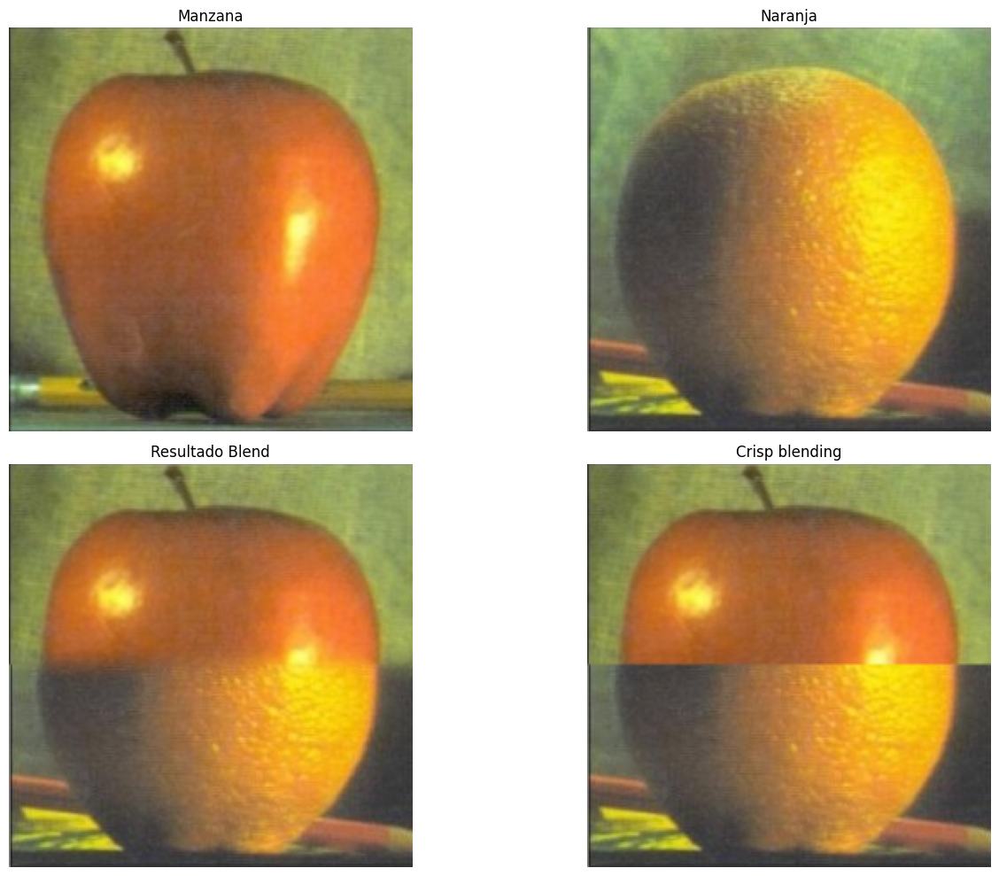

In [39]:
# Cargar las imágenes
im1 = cv2.imread(get_image('apple.jpg')).astype(np.float32) / 255.0
im2 = cv2.imread(get_image('orange.jpg')).astype(np.float32) / 255.0

# Generar la máscara automáticamente (horizontal en este caso)
mask = generate_mask(im1.shape, direction='vertical')

# Redimensionar las imágenes y la máscara para que tengan las mismas dimensiones
im1, im2, mask = resize_max_dimensions(im1, im2, mask)

# Aplicar blending piramidal en color
result = pyramideBlendColor(im2, im1, mask, nlevel=4)

# Realizar Crisp Blending utilizando la máscara
crisp_result = crispBlend(im1, im2, mask)

# Mostrar los resultados
display_images([im1, im2, result, crisp_result], titles=['Manzana', 'Naranja', 'Resultado Blend', 'Crisp blending'], columns=2)


**Análisis de los Resultados:**
- Pyramid Blending (Resultado Blend):

Este método es ideal para mezclar imágenes con texturas y colores diferentes porque permite una transición gradual y suave. En este caso, la textura rugosa de la naranja y la superficie suave de la manzana se mezclan sin que la línea divisoria sea demasiado notoria. El uso de pirámides Gaussianas y Laplacianas ayuda a preservar los detalles importantes en las zonas de alta frecuencia, mientras que el suavizado con la máscara crea una transición más natural.

- Crisp Blending:

En contraste, el crisp blending muestra una transición muy abrupta, lo que puede resultar menos agradable visualmente. Este método es más rápido y directo, pero no es adecuado cuando se quiere una combinación fluida, ya que los bordes se perciben claramente.